In [1]:
import numpy as np
import dxchange
import holotomo
import matplotlib.pyplot as plt
import cupy as cp
import scipy.ndimage as ndimage
import numpy as np
import sys

%matplotlib inline

# !jupyter nbconvert --to script rec.ipynb

# Init data sizes and parametes of the PXM of ID16A

In [2]:
# cp.cuda.Device(int(sys.argv[1])).use()
# ntheta = int(sys.argv[2])#750  # number of angles (rotations)
# ptheta = int(sys.argv[3])  # holography chunk size for GPU processing
# binning = int(sys.argv[4])
# niter = int(sys.argv[5])
# iter_step = int(sys.argv[6])
# flg_show = False

cp.cuda.Device(0).use()
ntheta = 100  # number of angles (rotations)
ptheta = 100  # holography chunk size for GPU processing
binning = 2
niter = 33
iter_step = 8
flg_show = True

cropx_left = 256
cropx_right = 256
cropy_up = 256
cropy_down = 256

n = (2048-cropx_left-cropx_right)//2**binning
print(n)
pn = 32  # tomography chunk size for GPU processing

center = n/2  # rotation axis

# ID16a setup
detector_pixelsize = 3e-6
energy = 17.05 #[keV] xray energy
focusToDetectorDistance = 1.208 # [m]
ndist = 4
sx0 = -2.493e-3
z1 = np.array([1.5335e-3,1.7065e-3,2.3975e-3,3.8320e-3])[:ndist]-sx0
z2 = focusToDetectorDistance-z1
distances = (z1*z2)/focusToDetectorDistance
magnifications = focusToDetectorDistance/z1
voxelsize = detector_pixelsize/magnifications[0]*2**binning  # object voxel size

norm_magnifications = magnifications/magnifications[0]
# scaled propagation distances due to magnified probes
distances = distances*norm_magnifications**2

z1p = z1[0]  # positions of the probe for reconstruction
z2p = z1-np.tile(z1p, len(z1))
# magnification when propagating from the probe plane to the detector
magnifications2 = (z1p+z2p)/z1p
# propagation distances after switching from the point source wave to plane wave,
distances2 = (z1p*z2p)/(z1p+z2p)
norm_magnifications2 = magnifications2/(z1p/z1[0])  # 
# scaled propagation distances due to magnified probes
distances2 = distances2*norm_magnifications2**2
distances2 = distances2*(z1p/z1)**2
# norm_magnifications[:] = 1

384


## Read data

In [3]:
data0 = np.zeros([ndist,ntheta,n,n],dtype='float32')
ref0 = np.zeros([ndist,n,n],dtype='float32')
dark0 = np.zeros([1,n,n],dtype='float32')

theta = np.loadtxt(f'/data/viktor/id16a/3d_ald4/3d_ald4_ht_10nm_/angles_file.txt').astype('float32')[:][:1500:1500//ntheta]
print(f'{theta=}')
for k in range(ndist):
    for j in range(0,ntheta):
        # print(j)
        jtheta=j*1500//ntheta
        fname = f'/data/viktor/id16a/3d_ald4/3d_ald4_ht_10nm_{k+1}_/3d_ald4_ht_10nm_{k+1}_{jtheta:04}.edf'
        tmp = dxchange.read_edf(fname)[0,cropy_up:2048-cropy_down,cropx_left:2048-cropx_right]
        for kb in range(binning):
            tmp = (tmp[::2]+tmp[1::2])/2
            tmp = (tmp[:,::2]+tmp[:,1::2])/2
        data0[k,j] = tmp

    tmp = dxchange.read_edf(f'/data/viktor/id16a/3d_ald4/3d_ald4_ht_10nm_{k+1}_/refHST0000.edf')[0,cropy_up:2048-cropy_down,cropx_left:2048-cropx_right]
    for kb in range(binning):
        tmp = (tmp[::2]+tmp[1::2])/2
        tmp = (tmp[:,::2]+tmp[:,1::2])/2
    ref0[k] = tmp

tmp = dxchange.read_edf(f'/data/viktor/id16a/3d_ald4/3d_ald4_ht_10nm_1_/dark.edf')[0,cropy_up:2048-cropy_down,cropx_left:2048-cropx_right]
for kb in range(binning):
    tmp = (tmp[::2]+tmp[1::2])/2
    tmp = (tmp[:,::2]+tmp[:,1::2])/2
dark0[:] = tmp

mean_all = np.mean(data0[:,:,0:n//16,0:n//16])

mean_each = np.mean(data0[:,:,0:n//16,0:n//16],axis=(2,3))
data0 = data0*mean_all/mean_each[:,:,np.newaxis,np.newaxis]

ref0_mean = np.mean(ref0[:,0:n//16,0:n//16],axis=(1,2))
ref0 = ref0*mean_all/ref0_mean[:,np.newaxis,np.newaxis]


theta=array([  -0. ,   -1.8,   -3.6,   -5.4,   -7.2,   -9. ,  -10.8,  -12.6,
        -14.4,  -16.2,  -18. ,  -19.8,  -21.6,  -23.4,  -25.2,  -27. ,
        -28.8,  -30.6,  -32.4,  -34.2,  -36. ,  -37.8,  -39.6,  -41.4,
        -43.2,  -45. ,  -46.8,  -48.6,  -50.4,  -52.2,  -54. ,  -55.8,
        -57.6,  -59.4,  -61.2,  -63. ,  -64.8,  -66.6,  -68.4,  -70.2,
        -72. ,  -73.8,  -75.6,  -77.4,  -79.2,  -81. ,  -82.8,  -84.6,
        -86.4,  -88.2,  -90. ,  -91.8,  -93.6,  -95.4,  -97.2,  -99. ,
       -100.8, -102.6, -104.4, -106.2, -108. , -109.8, -111.6, -113.4,
       -115.2, -117. , -118.8, -120.6, -122.4, -124.2, -126. , -127.8,
       -129.6, -131.4, -133.2, -135. , -136.8, -138.6, -140.4, -142.2,
       -144. , -145.8, -147.6, -149.4, -151.2, -153. , -154.8, -156.6,
       -158.4, -160.2, -162. , -163.8, -165.6, -167.4, -169.2, -171. ,
       -172.8, -174.6, -176.4, -178.2], dtype=float32)


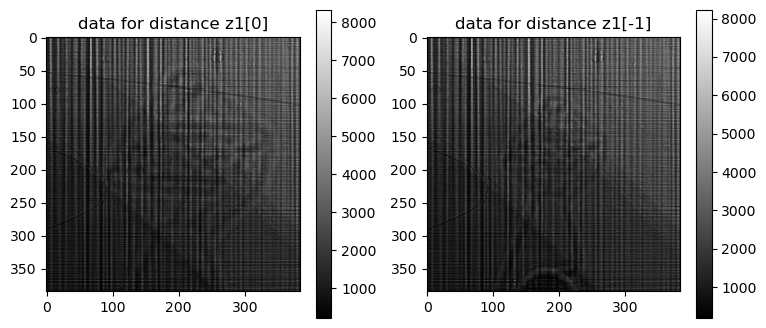

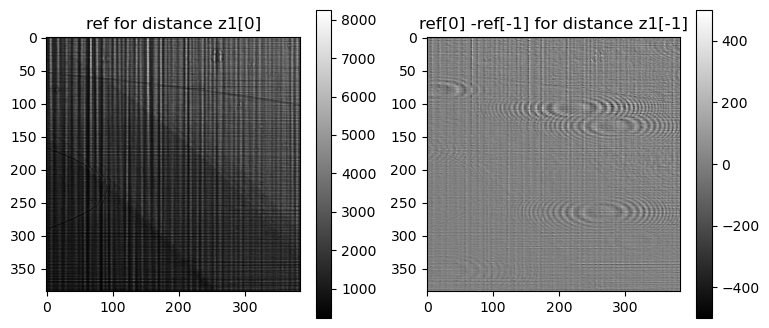

In [4]:
if flg_show:
    fig, axs = plt.subplots(1, 2, figsize=(9, 4))
    im=axs[0].imshow(data0[0,0],cmap='gray')
    axs[0].set_title('data for distance z1[0]')
    fig.colorbar(im)
    im=axs[1].imshow(data0[-1,0],cmap='gray')
    axs[1].set_title('data for distance z1[-1]')
    fig.colorbar(im)

    fig, axs = plt.subplots(1, 2, figsize=(9, 4))
    im=axs[0].imshow(ref0[0],cmap='gray')
    axs[0].set_title('ref for distance z1[0]')
    fig.colorbar(im)
    im=axs[1].imshow(ref0[0]-ref0[-1],cmap='gray',vmin=-500,vmax=500)
    axs[1].set_title('ref[0] -ref[-1] for distance z1[-1]')
    fig.colorbar(im)

# use second ref
ref0 = np.mean(ref0,axis=0)[np.newaxis]

# Dark-flat field correction

In [5]:

rdata = (data0-np.mean(dark0,axis=0))
rref = (np.mean(ref0,axis=0)-np.mean(dark0,axis=0))
rref[rref<0] = 0
rdata[rdata<0]=0
rdata/=(rref+1e-9)
for k in range(ndist):
    dxchange.write_tiff(rdata[k],f'/data/viktor/tmp/t{k}.tiff',overwrite=True)
for k in range(ndist):
    dxchange.write_tiff(data0[k]/ref0[0],f'/data/viktor/tmp/d{k}.tiff',overwrite=True)

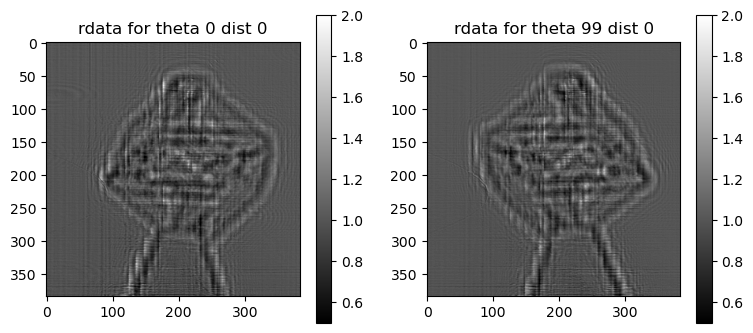

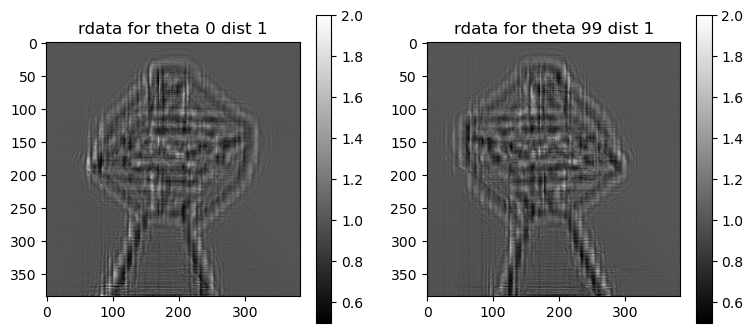

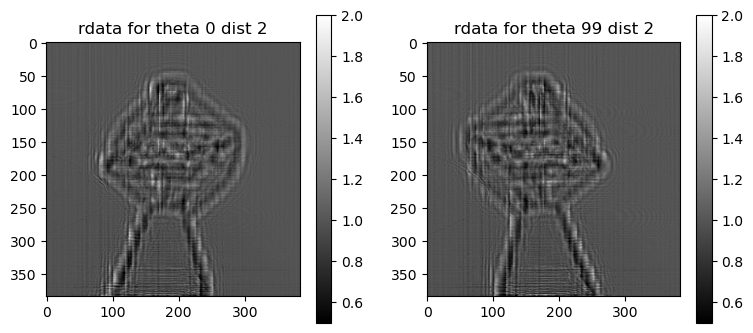

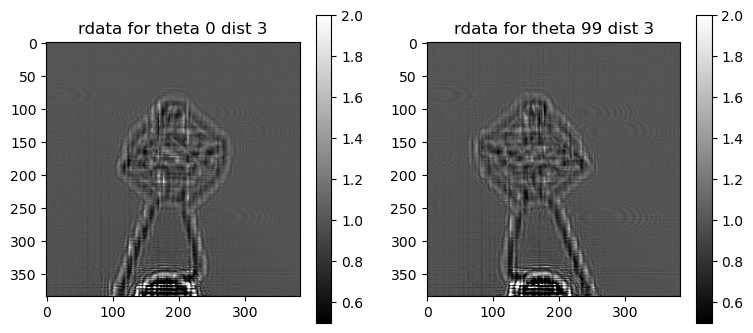

In [6]:
if flg_show:
    for k in range(ndist):
        fig, axs = plt.subplots(1, 2, figsize=(9, 4))
        im=axs[0].imshow(rdata[k,0],cmap='gray',vmin = 0.5,vmax=2 )
        axs[0].set_title(f'rdata for theta 0 dist {k}')
        fig.colorbar(im)
        im=axs[1].imshow(rdata[k,-1],cmap='gray',vmin = 0.5,vmax=2)
        axs[1].set_title(f'rdata for theta {ntheta-1} dist {k}')
        fig.colorbar(im)

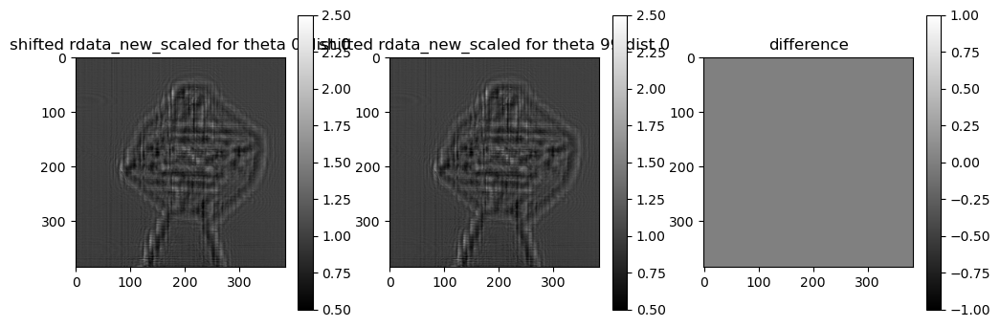

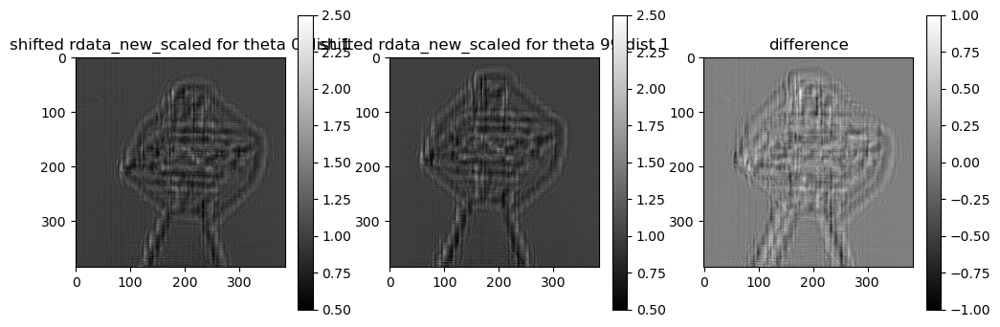

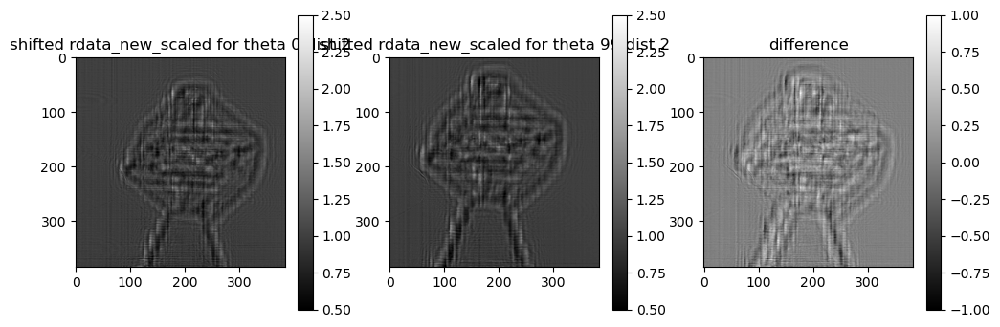

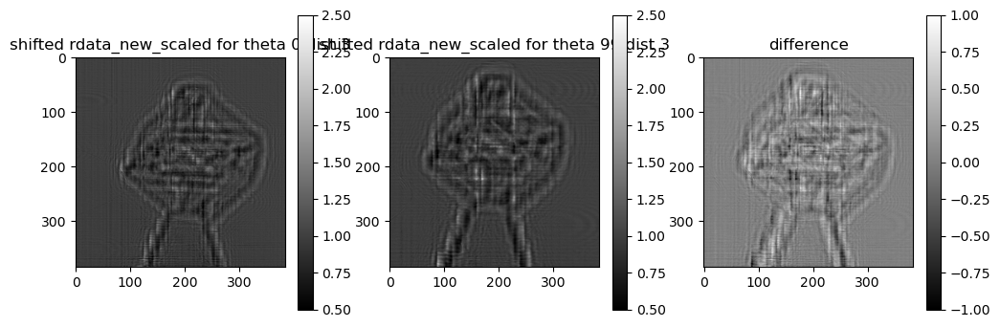

In [7]:
rdata_scaled = rdata.copy()
for j in range(ntheta):
    for k in range(ndist):    
        a = ndimage.zoom(rdata[k,j],1/norm_magnifications[k])
        rdata_scaled[k,j] = a[a.shape[0]//2-n//2:a.shape[0]//2+n//2,a.shape[1]//2-n//2:a.shape[1]//2+n//2]

if flg_show:
    for k in range(ndist):
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        im=axs[0].imshow(rdata_scaled[0,0],cmap='gray',vmin = 0.5,vmax=2.5 )
        axs[0].set_title(f'shifted rdata_new_scaled for theta 0 dist {k}')
        fig.colorbar(im)
        im=axs[1].imshow(rdata_scaled[k,0],cmap='gray',vmin = 0.5,vmax=2.5 )
        axs[1].set_title(f'shifted rdata_new_scaled for theta {ntheta-1} dist {k}')
        fig.colorbar(im)        
        im=axs[2].imshow(rdata_scaled[0,0]-rdata_scaled[k,0],cmap='gray',vmin =-1,vmax=1 )
        axs[2].set_title(f'difference')
        fig.colorbar(im)        

In [8]:
def apply_shift(psi, p):
    """Apply shift for all projections."""
    psi = cp.array(psi)
    p = cp.array(p)
    tmp = cp.pad(psi,((0,0),(n//2,n//2),(n//2,n//2)), 'symmetric')
    [x, y] = cp.meshgrid(cp.fft.rfftfreq(2*n),
                         cp.fft.fftfreq(2*n))
    shift = cp.exp(-2*cp.pi*1j *
                   (x*p[:, 1, None, None]+y*p[:, 0, None, None]))
    print(shift.shape,tmp.shape)
    res0 = cp.fft.irfft2(shift*cp.fft.rfft2(tmp))
    res = res0[:, n//2:3*n//2, n//2:3*n//2].get()
    return res

def _upsampled_dft(data, ups,
                   upsample_factor=1, axis_offsets=None):

    im2pi = 1j * 2 * np.pi
    tdata = data.copy()
    kernel = (np.tile(np.arange(ups), (data.shape[0], 1))-axis_offsets[:, 1:2])[
        :, :, None]*np.fft.fftfreq(data.shape[2], upsample_factor)
    kernel = np.exp(-im2pi * kernel)
    tdata = np.einsum('ijk,ipk->ijp', kernel, tdata)
    kernel = (np.tile(np.arange(ups), (data.shape[0], 1))-axis_offsets[:, 0:1])[
        :, :, None]*np.fft.fftfreq(data.shape[1], upsample_factor)
    kernel = np.exp(-im2pi * kernel)
    rec = np.einsum('ijk,ipk->ijp', kernel, tdata)

    return rec

def registration_shift(src_image, target_image, upsample_factor=1, space="real"):

    # assume complex data is already in Fourier space
    if space.lower() == 'fourier':
        src_freq = src_image
        target_freq = target_image
    # real data needs to be fft'd.
    elif space.lower() == 'real':
        src_freq = np.fft.fft2(src_image)
        target_freq = np.fft.fft2(target_image)

    # Whole-pixel shift - Compute cross-correlation by an IFFT
    shape = src_freq.shape
    image_product = src_freq * target_freq.conj()
    cross_correlation = np.fft.ifft2(image_product)
    A = np.abs(cross_correlation)
    maxima = A.reshape(A.shape[0], -1).argmax(1)
    maxima = np.column_stack(np.unravel_index(maxima, A[0, :, :].shape))

    midpoints = np.array([np.fix(axis_size / 2)
                          for axis_size in shape[1:]])

    shifts = np.array(maxima, dtype=np.float64)
    ids = np.where(shifts[:, 0] > midpoints[0])
    shifts[ids[0], 0] -= shape[1]
    ids = np.where(shifts[:, 1] > midpoints[1])
    shifts[ids[0], 1] -= shape[2]
    
    if upsample_factor > 1:
        # Initial shift estimate in upsampled grid
        shifts = np.round(shifts * upsample_factor) / upsample_factor
        upsampled_region_size = np.ceil(upsample_factor * 1.5)
        # Center of output array at dftshift + 1
        dftshift = np.fix(upsampled_region_size / 2.0)

        normalization = (src_freq[0].size * upsample_factor ** 2)
        # Matrix multiply DFT around the current shift estimate

        sample_region_offset = dftshift - shifts*upsample_factor
        cross_correlation = _upsampled_dft(image_product.conj(),
                                                upsampled_region_size,
                                                upsample_factor,
                                                sample_region_offset).conj()
        cross_correlation /= normalization
        # Locate maximum and map back to original pixel grid
        A = np.abs(cross_correlation)
        maxima = A.reshape(A.shape[0], -1).argmax(1)
        maxima = np.column_stack(
            np.unravel_index(maxima, A[0, :, :].shape))

        maxima = np.array(maxima, dtype=np.float64) - dftshift

        shifts = shifts + maxima / upsample_factor
           
    return shifts

shifts_random = np.zeros([ndist,ntheta,2],dtype='float32')
for k in range(ndist):
    s = np.loadtxt(f'/data/viktor/id16a/3d_ald4/3d_ald4_ht_10nm_{k+1}_/correct.txt').astype('float32')[:1500:1500//ntheta]/norm_magnifications[k]
    shifts_random[k,:,0] = s[:,1]
    shifts_random[k,:,1] = s[:,0]
shifts_dist = np.zeros([ndist,ntheta,2],dtype='float32')
rdata_scaled_tmp=rdata_scaled.copy()
for j in range(ntheta):
    for k in range(0,ndist):#!!!!!!!!!!!!!!
        print(rdata_scaled[k,j:j+1].shape,(-shifts_random[k,j:j+1]/2**binning).shape)
        a = apply_shift(rdata_scaled[k,j:j+1],-shifts_random[k,j:j+1]/2**binning)# note first shift then magnification    
        rdata_scaled_tmp[k,j:j+1] = a    
        shifts_dist[k,j] = registration_shift(a,rdata_scaled_tmp[0,j:j+1],upsample_factor=10)
        print(f'{k} {j}: {shifts_random[k,j:j+1]/2**binning} {shifts_dist[k,j]}')
# raise Exception

(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
0 0: [[0. 0.]] [0. 0.]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
1 0: [[0. 0.]] [-20.3 -24.6]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
2 0: [[0. 0.]] [-22.  -25.4]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
3 0: [[0. 0.]] [-20.8 -20.3]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
0 1: [[3.098125  1.6108325]] [0. 0.]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
1 1: [[-3.115859  2.578732]] [-20.1 -25.6]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
2 1: [[ 1.0647814 -3.7125714]] [-23.1 -26.4]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
3 1: [[-1.6520046 -1.1277359]] [-19.9 -20.7]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
0 2: [[-2.9275     1.9808325]] [0. 0.]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
1 2: [[-2.3414571 -2.8655472]] [-20.9 -25.4]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
2 2: [[3.1113553 1.5867951]] [-23.1 -25.6]
(1, 384, 384) (1, 2)
(1, 768, 385) (1, 768, 768)
3 2: 

In [9]:
dxchange.write_tiff(rdata_scaled_tmp[0],'/data/viktor/holo/tmp0.tiff',overwrite=True)
dxchange.write_tiff(rdata_scaled_tmp[1],'/data/viktor/holo/tmp1.tiff',overwrite=True)
dxchange.write_tiff(rdata_scaled_tmp[2],'/data/viktor/holo/tmp2.tiff',overwrite=True)
dxchange.write_tiff(rdata_scaled_tmp[3],'/data/viktor/holo/tmp3.tiff',overwrite=True)


In [10]:
            
from ipywidgets import interact
import ipywidgets as widgets
if flg_show:
    def plot_projections(sid=1):
        plt.imshow(np.abs(rdata_scaled_tmp[2,sid]),cmap='gray',vmin=0.5,vmax=2)
        # plt.colorbar()
    interact(plot_projections, sid = widgets.IntSlider(value=0,
                                                min=0,
                                                max=rdata.shape[1]-1,
                                                step=1))

    

interactive(children=(IntSlider(value=0, description='sid', max=99), Output()), _dom_classes=('widget-interact…

# Total shifts in pixels before normalized scaling

[[[  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.           -0.        ]
  [  -0.

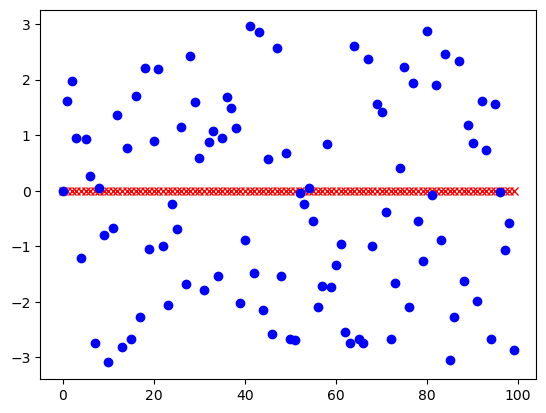

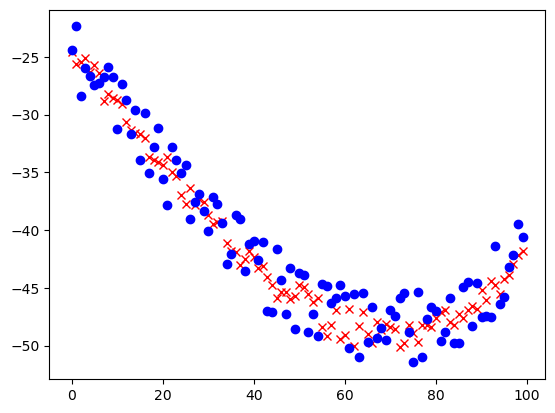

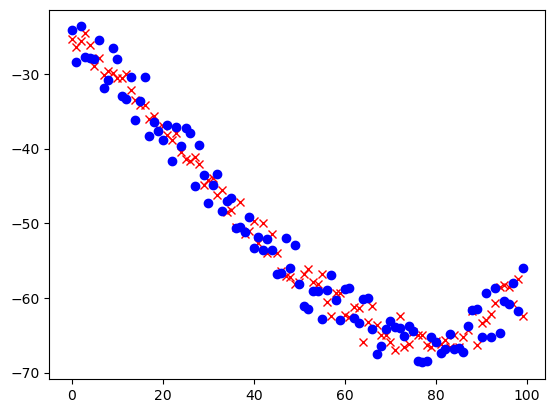

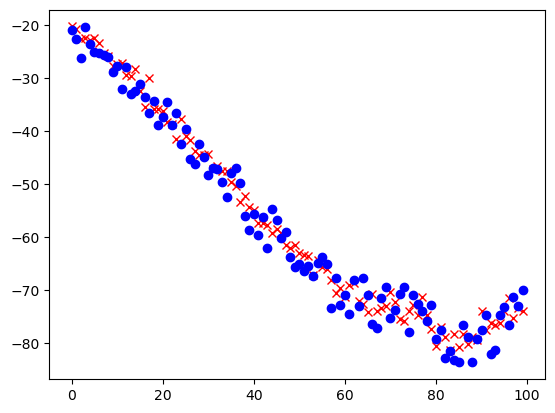

In [11]:

import scipy.io 
shifts_new = -scipy.io.loadmat('/data/viktor/id16a/3d_ald4/3d_ald4_ht_10nm_/rhapp_py.mat')['rhapp'][:,:,:1500:1500//ntheta].swapaxes(0,2).swapaxes(0,1)[:ndist]

print(shifts_new)
shifts_new+=shifts_random
shifts_new/=2**binning
# shifts_new*=norm_magnifications[:,np.newaxis,np.newaxis]


shifts = (shifts_dist+shifts_random/2**binning)#*norm_magnifications[:,np.newaxis,np.newaxis]# cannot be combined with 

if flg_show:
    for k in range(ndist):
        plt.figure()
        plt.plot(shifts[k,:,1],'rx')
        plt.plot(shifts_new[k,:,1],'bo')

# take shifts from Peter
shifts = shifts_new


# TEST: Scale initial data to 1 magnification and apply all shifts

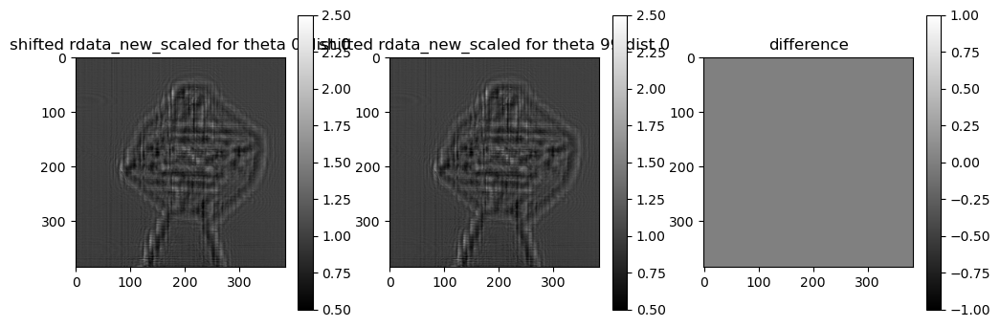

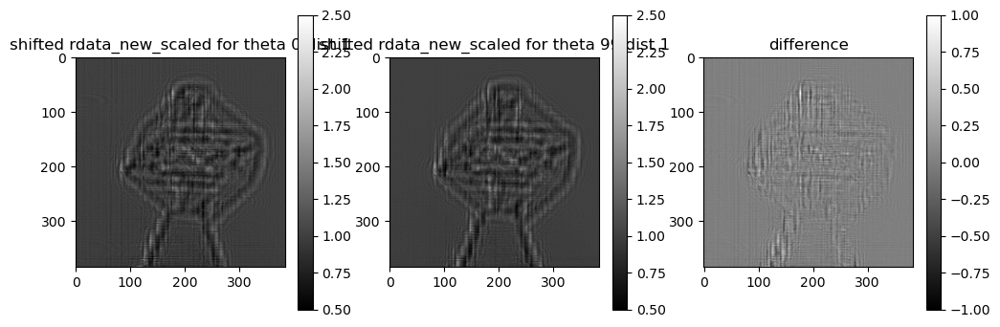

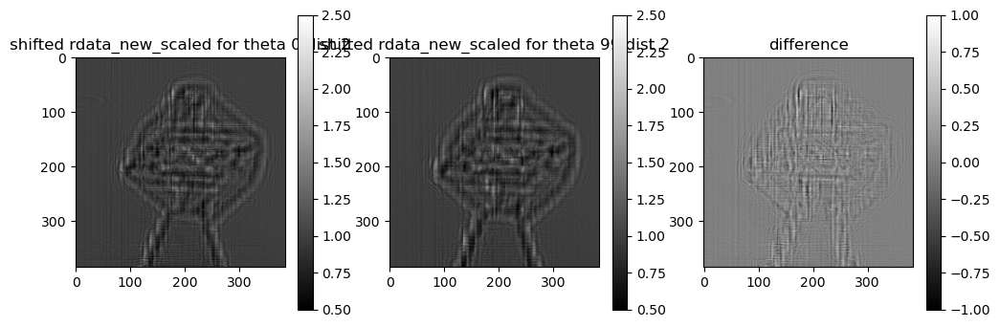

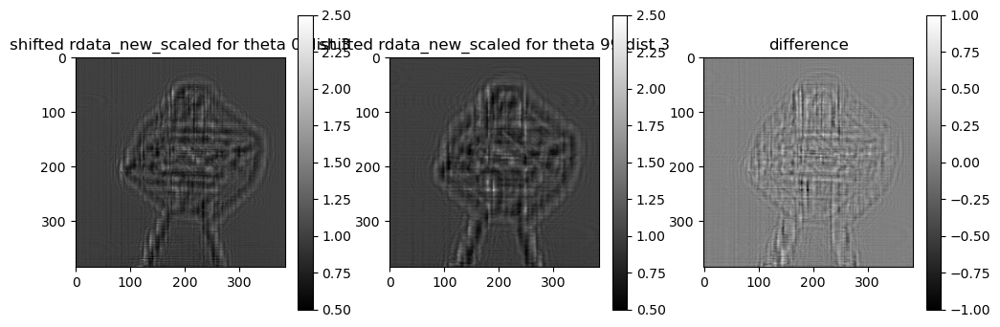

In [12]:
def apply_shift(psi, p):
    """Apply shift for all projections."""
    psi = cp.array(psi)
    p = cp.array(p)
    tmp = cp.pad(psi,((0,0),(n//2,n//2),(n//2,n//2)), 'symmetric')
    [x, y] = cp.meshgrid(cp.fft.rfftfreq(2*n),
                         cp.fft.fftfreq(2*n))
    shift = cp.exp(-2*cp.pi*1j *
                   (x*p[:, 1, None, None]+y*p[:, 0, None, None]))
    res0 = cp.fft.irfft2(shift*cp.fft.rfft2(tmp))
    res = res0[:, n//2:3*n//2, n//2:3*n//2].get()
    return res
rdata_scaled_new = rdata.copy()
for j in range(ntheta):
    for k in range(ndist):    
        a = apply_shift(rdata[k,j:j+1],-shifts[k,j:j+1]*norm_magnifications[k,np.newaxis,np.newaxis])[0]# note first shift then magnification
        a = ndimage.zoom(a,1/norm_magnifications[k])
        rdata_scaled_new[k,j] = a[a.shape[0]//2-n//2:a.shape[0]//2+n//2,a.shape[1]//2-n//2:a.shape[1]//2+n//2]  

if flg_show:
    for k in range(ndist):
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        im=axs[0].imshow(rdata_scaled_new[0,0],cmap='gray',vmin = 0.5,vmax=2.5 )
        axs[0].set_title(f'shifted rdata_new_scaled for theta 0 dist {k}')
        fig.colorbar(im)
        im=axs[1].imshow(rdata_scaled_new[k,0],cmap='gray',vmin = 0.5,vmax=2.5 )
        axs[1].set_title(f'shifted rdata_new_scaled for theta {ntheta-1} dist {k}')
        fig.colorbar(im)        
        im=axs[2].imshow(rdata_scaled_new[0,0]-rdata_scaled_new[k,0],cmap='gray',vmin =-1,vmax=1 )
        axs[2].set_title(f'difference')
        fig.colorbar(im)          
    

In [13]:
            
from ipywidgets import interact
import ipywidgets as widgets
# plt.figure(figsize=(7,7))
# if flg_show:
#     def plot_projections(sid=1):
#         plt.imshow(np.abs(rdata_scaled_new[0,sid]),cmap='gray',vmin=0.5,vmax=2)
#         plt.colorbar()
#     interact(plot_projections, sid = widgets.IntSlider(value=0,
#                                                 min=0,
#                                                 max=rdata.shape[1]-1,
#                                                 step=1))
# dxchange.write_tiff(rdata_scaled_new[0],'/data/tmp/t',overwrite=True)
# raise Exception

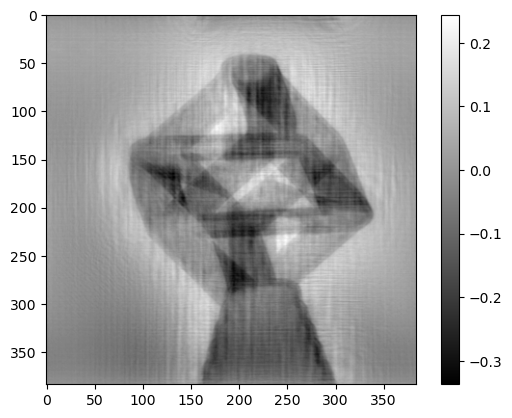

In [14]:
def CTFPurePhase(rads, wlen, dists, fx, fy, alpha):
   """
   weak phase approximation from Cloetens et al. 2002




   Parameters
   ----------
   rad : 2D-array
       projection.
   wlen : float
       X-ray wavelentgth assumes monochromatic source.
   dist : float
       Object to detector distance (propagation distance) in mm.
   fx, fy : ndarray
       Fourier conjugate / spatial frequency coordinates of x and y.
   alpha : float
       regularization factor.
       
   Return
   ------
   phase retrieved projection in real space
   """    
   numerator = 0
   denominator = 0    
   for j in range(0, len(dists)):    
       rad_freq = np.fft.fft2(rads[j])
       taylorExp = np.sin(np.pi*wlen*dists[j]*(fx**2+fy**2)) 
       numerator = numerator + taylorExp * (rad_freq)
       denominator = denominator + 2*taylorExp**2 
   numerator = numerator / len(dists)
   denominator = (denominator / len(dists)) + alpha
   phase = np.real(  np.fft.ifft2(numerator / denominator) )
   phase = 0.5 * phase
   return phase


distances_rec = (distances/norm_magnifications**2)[:ndist]

fx = np.fft.fftfreq(n,d=voxelsize)
[fx,fy] = np.meshgrid(fx,fx)

wlen = 1.24e-9/energy
recCTFPurePhase = np.zeros([ntheta,n,n],dtype='complex64')
for k in range(ntheta):
    rads = rdata_scaled_new[:ndist,k]
    recCTFPurePhase[k] = np.exp(1j*CTFPurePhase(rads, wlen, distances_rec, fx, fy, 1e-3))
if flg_show:
    plt.imshow(np.angle(recCTFPurePhase[-1]),cmap='gray')
    plt.colorbar()
dxchange.write_tiff(np.angle(recCTFPurePhase),f'/data/vnikitin/holo/r{n}_{ntheta}_{ndist}/CTF.tiff',overwrite=True)



In [15]:
#raise Exception

## Create a solver class for holography

In [16]:
pslv = holotomo.SolverHolo(ntheta, n, ptheta, voxelsize, energy, distances, norm_magnifications,distances2)

note ptheta parameter is used to define the number of angles for simultaneous processing by 1 gpu. Currently pntheta=ntheta. If the gpu does not have enough memory then ptheta should  be decreased
norm_magnifications are magnifications for different distances, normalized by the magnification for the first distance

## Adjoint test

In [17]:
data = data0.copy()
ref = ref0.copy()
arr1 = np.pad(np.array(data[0]+1j*data[0]).astype('complex64'),((0,0),(n//2,n//2),(n//2,n//2)),'symmetric')
prb1 = np.array(ref[:]+1j*ref[:]).astype('complex64')
shifts_ref = shifts[:]
print(arr1.shape,prb1.shape,shifts_ref.shape)
arr2 = pslv.fwd_holo_batch(arr1,prb1, shifts_ref)
arr3 = pslv.adj_holo_batch(arr2,prb1, shifts_ref)
prb3 = pslv.adj_holo_prb_batch(arr2,arr1, shifts_ref)



print(np.sum(arr1*np.conj(arr3)))
print(np.sum(arr2*np.conj(arr2)))
print(np.sum(prb1*np.conj(prb3)))

(100, 768, 768) (1, 384, 384) (4, 100, 2)
(6.41406e+21-18119997000000j)
(6.4140474e+21-2720400600j)
(6.4140474e+21+166822970000000j)


## $\ \sum_j\sum_i||\mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_j S_{r_{ij}}\psi_i))|-\sqrt{\text{I}_{ij}}\|^2_2 + \||\mathcal{G}_{d_0}q|-\sqrt{\text{I}_r}\|_2^2\to \text{min}_{\psi_i,q}$ 

In [18]:
def line_search(minf, gamma, fu, fu0, fd, fd0):
    """ Line search for the step sizes gamma"""
    while(minf(fu,fu0)-minf(fu+gamma*fd, fu0+gamma*fd0) < 0 and gamma > 1e-12):
        gamma *= 0.5
    if(gamma <= 1e-12):  # direction not found
        #print('no direction')
        gamma = 0
    return gamma

from holotomo.utils import chunk
# def adj_holo_batch_ext(pslv):
def adj_holo_batch_ext(pslv,fpsi, data, prb, shifts=None, code=None, shifts_code=None):
    """Batch of Holography transforms"""
    res = np.zeros([ntheta, 2*pslv.n, 2*pslv.n], dtype='complex64')
    prb_gpu = cp.array(prb)
    shifts_gpu = None        
    shifts_code_gpu = None
    code_gpu = None

    if code is not None:
        code_gpu = cp.array(code)   
    for ids in chunk(range(pslv.ntheta), pslv.ptheta):
        # copy data part to gpu
        fpsi_gpu = cp.array(fpsi[:, ids])
        data_gpu = cp.array(data[:, ids])
            
        if shifts is not None:
            shifts_gpu = cp.array(shifts[:,ids])
        if shifts_code is not None:
            shifts_code_gpu = cp.array(shifts_code[:,ids])
        fpsi_gpu = fpsi_gpu-data_gpu*cp.exp(1j*(np.angle(fpsi_gpu)))        
        # Radon transform
        res_gpu = -pslv.adj_holo(fpsi_gpu, prb_gpu, shifts_gpu, code_gpu, shifts_code_gpu)
        # copy result to cpu
        res[ids] = res_gpu.get()
    return res

def adj_holo_prb_batch_ext(pslv, fpsi, data, psi, shifts=None, code=None, shifts_code=None):
        """Batch of Holography transforms"""
        res = np.zeros([1, pslv.n, pslv.n], dtype='complex64')
        shifts_gpu = None        
        shifts_code_gpu = None
        code_gpu = None
        if code is not None:
            code_gpu = cp.array(code)   
        for ids in chunk(range(pslv.ntheta), pslv.ptheta):
            # copy data part to gpu
            fpsi_gpu = cp.array(fpsi[:, ids])
            psi_gpu = cp.array(psi[ids])
            data_gpu = cp.array(data[:, ids])
            
            if shifts is not None:
                shifts_gpu = cp.array(shifts[:,ids])
            if shifts_code is not None:
                shifts_code_gpu = cp.array(shifts_code[:,ids])
            # Radon transform
            fpsi_gpu = fpsi_gpu-data_gpu*cp.exp(1j*(np.angle(fpsi_gpu)))                
            # fprb-data*np.exp(1j*np.angle(fprb))
            res_gpu = -pslv.adj_holo_prb(fpsi_gpu, psi_gpu, shifts_gpu,code_gpu,shifts_code_gpu)
            # copy result to cpu
            res += res_gpu.get()
        return res

import time
def cg_holo_batch2(pslv, pslv0, data, data_ref, init, init_prb,  piter,shifts, upd_psi=True, upd_prb=False,step=1,vis_step=1):
    """Conjugate gradients method for holography"""

    data = np.sqrt(data)
    data_ref = np.sqrt(data_ref)
    
    # minimization functional
    def minf(fpsi,fprb):
        f = np.linalg.norm(np.abs(fpsi)-data)**2            
        f += np.linalg.norm(np.abs(fprb)-data_ref)**2        
        return f        
    
    psi = init.copy()
    prb = init_prb.copy()
    gammapsi = 1
    gammaprb = 0.5
    
    psi_nil = psi*0+1
    shifts_nil = shifts*0+1
    
    for i in range(piter):
        if upd_psi:
            fpsi = pslv.fwd_holo_batch(psi,prb,shifts)          
            # d = -pslv.adj_holo_batch(fpsi-data*np.exp(1j*(np.angle(fpsi))), prb,shifts)/np.max(np.abs(prb))**2
            d = adj_holo_batch_ext(pslv,fpsi,data, prb,shifts)/np.max(np.abs(prb))**2
                       
            # line search
            fd = pslv.fwd_holo_batch(d, prb,shifts)     
            
            gammapsi = line_search(minf, 1, fpsi, 0, fd, 0)
            
            psi = psi+gammapsi*d
            
        if upd_prb:
            fprb = pslv.fwd_holo_batch(psi,prb,shifts)
            fprb0 = pslv0.fwd_holo_batch(psi_nil,prb,shifts_nil)
            
            # dprb = -pslv.adj_holo_prb_batch(fprb-data*np.exp(1j*np.angle(fprb)),psi,shifts)#/ndist**2
            # dprb -= pslv0.adj_holo_prb_batch(fprb0-data_ref*np.exp(1j*np.angle(fprb0)),psi_nil,shifts_nil)
            
            dprb = adj_holo_prb_batch_ext(pslv,fprb,data,psi,shifts)#/ndist**2            
            dprb += adj_holo_prb_batch_ext(pslv0,fprb0,data_ref,psi_nil,shifts_nil)
            dprb *= 1/(pslv.ntheta+1)
            

            # line search
            fdprb = pslv.fwd_holo_batch(psi, dprb,shifts)
            fdprb0 = pslv0.fwd_holo_batch(psi_nil, dprb,shifts_nil)
            
            
            gammaprb = line_search(minf, 0.5, fprb, fprb0, fdprb, fdprb0)
            
            prb = prb + gammaprb*dprb
            
        if i%step==0:
            fprb = pslv.fwd_holo_batch(psi,prb,shifts)
            fprb0 = pslv0.fwd_holo_batch(psi_nil,prb,shifts_nil)            
            err=minf(fprb,fprb0)
            print(f'{i}) {gammapsi=} {gammaprb=}, {err=:1.5e}')  
    
        
        if i%vis_step==0:  
            if flg_show:
                fig, axs = plt.subplots(1, 2, figsize=(10, 5))
                im=axs[0].imshow(np.angle(recCTFPurePhase[0]),cmap='gray')
                axs[0].set_title('reconstructed CTF phase')
                fig.colorbar(im)
                im=axs[1].imshow(np.angle(psi[0,n//2:-n//2,n//2:-n//2]),cmap='gray')
                axs[1].set_title('reconstructed phase')
                fig.colorbar(im)                
                plt.show()
            dxchange.write_tiff(np.angle(psi),f'/data/vnikitin/holo/r{n}_{ntheta}_{ndist}/r{i:05}.tiff',overwrite=True)
            dxchange.write_tiff(np.angle(psi[0]),f'/data/vnikitin/holo/r{n}_{ntheta}_{ndist}/o{i:05}.tiff',overwrite=True)
            
    return psi,prb


In [19]:
def line_search(minf, gamma, fu, fu0, fd, fd0):
    """ Line search for the step sizes gamma"""
    while(minf(fu,fu0)-minf(fu+gamma*fd, fu0+gamma*fd0) < 0 and gamma > 1e-12):
        gamma *= 0.5
    if(gamma <= 1e-12):  # direction not found
        #print('no direction')
        gamma = 0
    return gamma


def cg_holo(pslv, pslv0, data, data_ref, init, init_prb,  piter,shifts, upd_psi=True, upd_prb=False,step=1,vis_step=1):
    """Conjugate gradients method for holography"""

    data = cp.sqrt(data)
    data_ref = cp.sqrt(data_ref)

    # minimization functional
    def minf(fpsi,fprb):
        f = cp.linalg.norm(cp.abs(fpsi)-data)**2            
        f += cp.linalg.norm(cp.abs(fprb)-data_ref)**2        
        # f = cp.linalg.norm(cp.abs(fpsi)**2-data)**2            
        return f        
    psi = init.copy()
    prb = init_prb.copy()
    gammapsi = 1
    gammaprb = 0.5
    shifts = cp.array(shifts)
    psi_nil = psi*0+1
    shifts_nil = shifts*0+1
    
    for i in range(piter):
        if upd_psi:
            
            fpsi = pslv.fwd_holo(psi,prb,shifts)          
            d = -pslv.adj_holo(fpsi-data*cp.exp(1j*(cp.angle(fpsi))), prb,shifts)/cp.max(cp.abs(prb))**2#/ndist**2

            fd = pslv.fwd_holo(d, prb,shifts)     
            gammapsi = line_search(minf, 1, fpsi, 0, fd, 0)
            psi = psi+gammapsi*d
            
        if upd_prb:
            fprb = pslv.fwd_holo(psi,prb,shifts)
            fprb0 = pslv0.fwd_holo(psi_nil,prb,shifts*0)
            dprb = pslv.adj_holo_prb(fprb-data*cp.exp(1j*cp.angle(fprb)),psi,shifts)#/ndist**2
            dprb += pslv0.adj_holo_prb(fprb0-data_ref*cp.exp(1j*cp.angle(fprb0)),psi_nil,shifts_nil)
            dprb*=-1/(pslv.ntheta+1)

            # line search
            fdprb = pslv.fwd_holo(psi, dprb,shifts)
            fdprb0 = pslv0.fwd_holo(psi_nil, dprb,shifts*0)
            
            gammaprb = line_search(minf, 0.5, fprb, fprb0, fdprb, fdprb0)
            prb = prb + gammaprb*dprb
            
        if i%step==0:
            fprb = pslv.fwd_holo(psi,prb,shifts)
            fprb0 = pslv0.fwd_holo(psi_nil,prb,shifts*0)            
            err=minf(fprb,fprb0)
            print(f'{i}) {gammapsi=} {gammaprb=}, {err=:1.5e}')  
    
        if i%vis_step==0:              
            fig, axs = plt.subplots(1, 2, figsize=(10, 5))
            im=axs[0].imshow(np.angle(recCTFPurePhase[0]),cmap='gray')
            axs[0].set_title('reconstructed phase CTF')
            fig.colorbar(im)
            im=axs[1].imshow(np.angle(psi[0,n//2:-n//2,n//2:-n//2].get()),cmap='gray')
            axs[1].set_title('reconstructed phase zoom')
            fig.colorbar(im)
            # im=axs[1,0].imshow(np.abs(prb[0].get()),cmap='gray')
            # axs[1,0].set_title('reconstructed amplitude')
            # fig.colorbar(im)
            # im=axs[1,1].imshow(np.angle(prb[0].get()),cmap='gray')
            # axs[1,1].set_title('reconstructed phase')
            # fig.colorbar(im)
            
            plt.show()
            #dxchange.write_tiff(cp.angle(psi[0]).get(),f'/data/tmp/holorec/r{i:05}.tiff',overwrite=True)
            
    return psi,prb

def cg_holo_batch(pslv, pslv0, data,data_ref, init, prb_init, piter,shifts=None,upd_psi=True,upd_prb=False,step=1,vis_step=1):
    """Batch of CG solvers"""
    
    res = np.zeros([pslv.ntheta, 2*pslv.n, 2*pslv.n], dtype='complex64')
    prb_init_gpu = cp.array(prb_init)                

    for ids in holotomo.utils.chunk(range(pslv.ntheta), pslv.ptheta):
        # copy data part to gpu
        data_gpu = cp.array(data[:,ids])
        data_ref_gpu = cp.array(data_ref)
        
        init_gpu = cp.array(init[ids])
        
        # Radon transform
        res_gpu,res_prb_gpu = cg_holo(pslv, pslv0, data_gpu,data_ref_gpu, init_gpu,prb_init_gpu, piter,shifts,upd_psi, upd_prb,step,vis_step)
        # copy result to cpu
        res[ids] = res_gpu.get()
        res_prb = res_prb_gpu.get()
    return res,res_prb


0) gammapsi=1 gammaprb=0.5, err=1.25448e+08


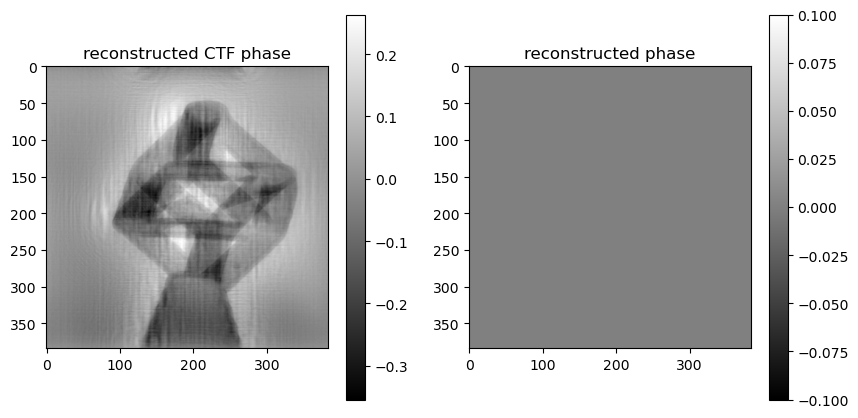

1) gammapsi=1 gammaprb=0.5, err=3.13621e+07
2) gammapsi=1 gammaprb=0.5, err=7.84052e+06
3) gammapsi=1 gammaprb=0.5, err=1.96014e+06
4) gammapsi=1 gammaprb=0.5, err=4.90035e+05
5) gammapsi=1 gammaprb=0.5, err=1.22507e+05
6) gammapsi=1 gammaprb=0.5, err=3.06269e+04
7) gammapsi=1 gammaprb=0.5, err=7.65715e+03
8) gammapsi=1 gammaprb=0.5, err=1.91426e+03
9) gammapsi=1 gammaprb=0.5, err=4.78592e+02
10) gammapsi=1 gammaprb=0.5, err=1.19642e+02
11) gammapsi=1 gammaprb=0.5, err=2.98982e+01
12) gammapsi=1 gammaprb=0.5, err=7.47306e+00
13) gammapsi=1 gammaprb=0.5, err=1.87229e+00
14) gammapsi=1 gammaprb=0.5, err=4.66618e-01
15) gammapsi=1 gammaprb=0.5, err=1.14608e-01
16) gammapsi=1 gammaprb=0.5, err=2.97857e-02
17) gammapsi=1 gammaprb=0.5, err=7.56645e-03
18) gammapsi=1 gammaprb=0.5, err=1.88205e-03
19) gammapsi=1 gammaprb=0.5, err=4.31877e-04
20) gammapsi=1 gammaprb=0.5, err=1.75683e-04
21) gammapsi=1 gammaprb=0.5, err=4.12989e-05
22) gammapsi=1 gammaprb=0.5, err=1.78733e-05
23) gammapsi=1 gamm

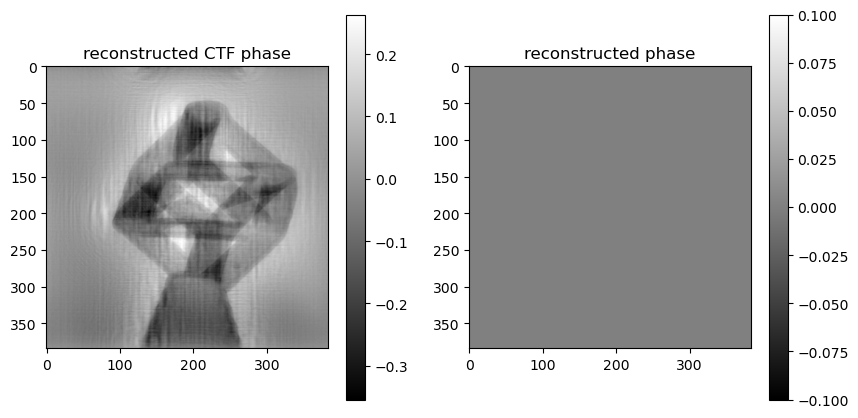

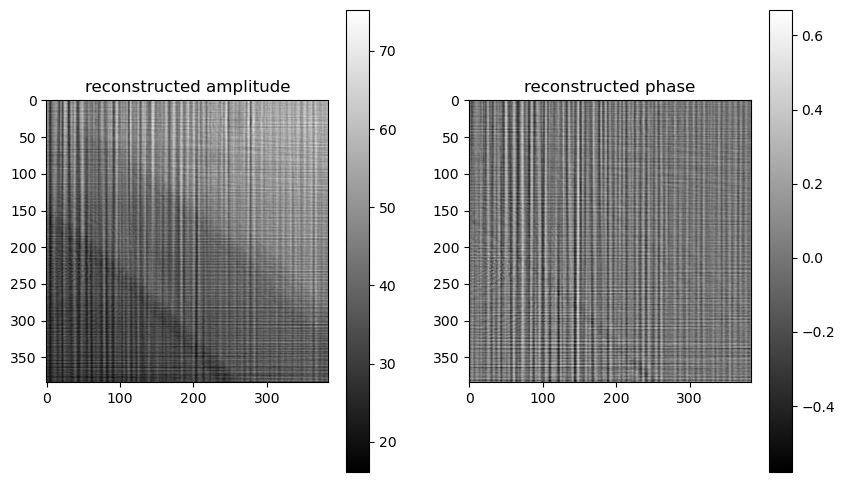

In [20]:

pslv = holotomo.SolverHolo(ntheta, n, ptheta, voxelsize, energy, distances, norm_magnifications, distances2) 
pslv0 = holotomo.SolverHolo(1, n, 1, voxelsize, energy, distances[:1], norm_magnifications[:1], distances2[:1]) 


rec = np.ones([1,2*n,2*n],dtype='complex64')
rec_prb = np.ones([1,n,n],dtype='complex64')        
data_ref = rref[np.newaxis,np.newaxis]
shifts_ref = np.array(shifts)[:1,:1]*0
_,rec_prb0 = cg_holo_batch2(pslv0, pslv0, data_ref, data_ref, rec, rec_prb, 32, shifts_ref, False,True,1,31)
if flg_show:
    fig, axs = plt.subplots(1, 2, figsize=(10, 6))
    im=axs[0].imshow(np.abs(rec_prb0[0]),cmap='gray')
    axs[0].set_title('reconstructed amplitude')
    fig.colorbar(im)
    im=axs[1].imshow(np.angle(rec_prb0[0]),cmap='gray')
    axs[1].set_title('reconstructed phase')
    fig.colorbar(im)


0) gammapsi=1 gammaprb=0.25, err=1.85875e+08


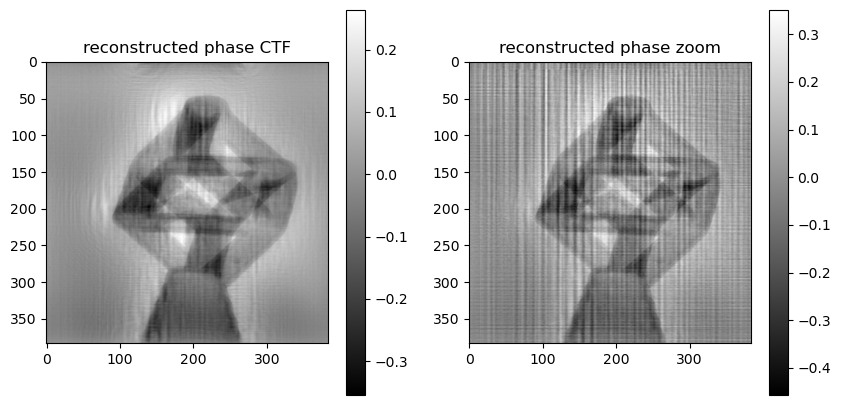

32) gammapsi=1 gammaprb=0.5, err=1.88082e+07


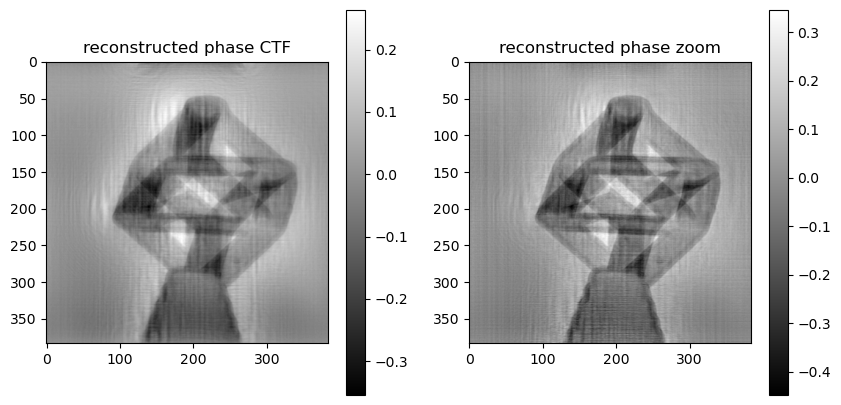

64) gammapsi=1 gammaprb=0.5, err=1.29511e+07


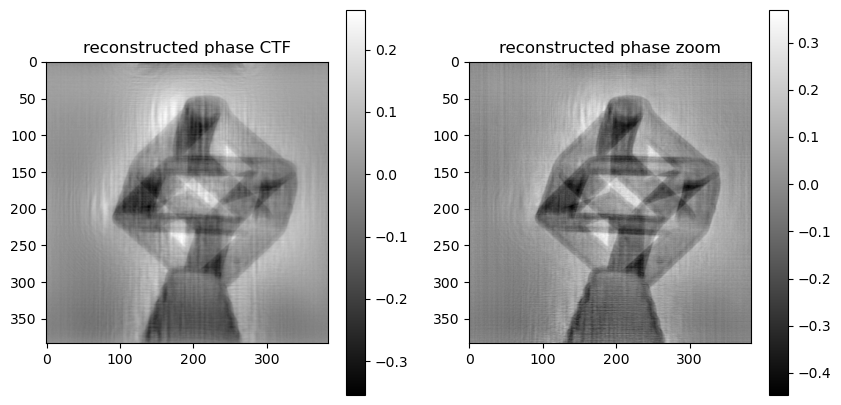

96) gammapsi=1 gammaprb=0.5, err=1.00734e+07


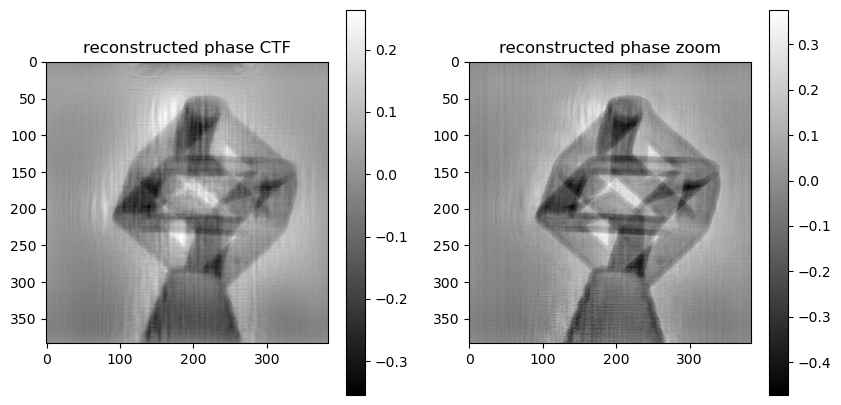

128) gammapsi=1 gammaprb=0.5, err=8.41216e+06


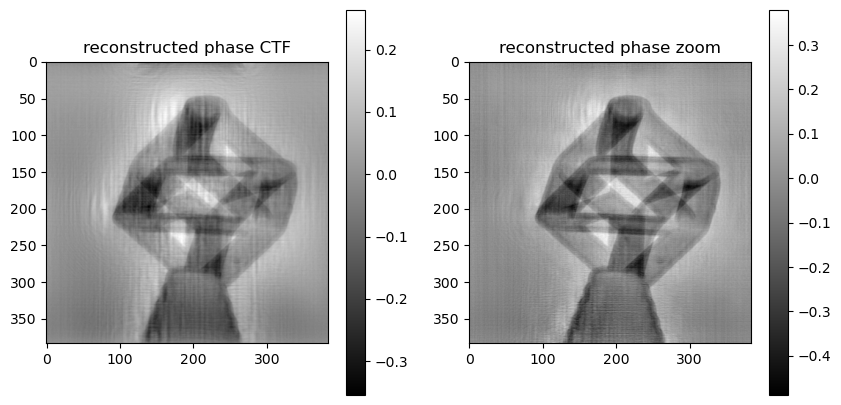

160) gammapsi=1 gammaprb=0.5, err=7.36936e+06


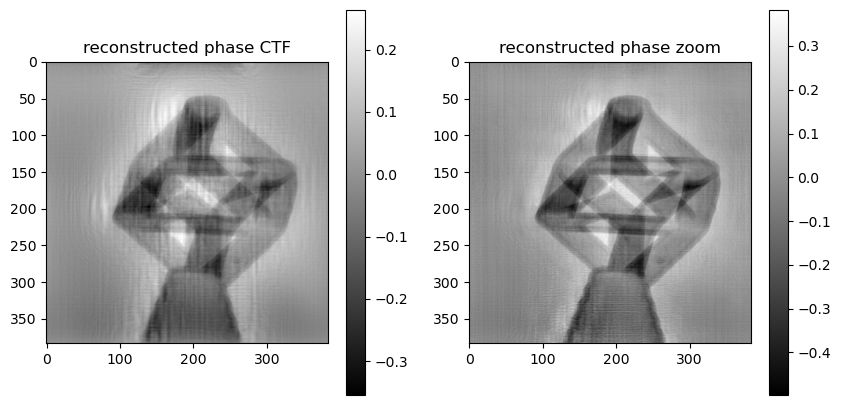

192) gammapsi=1 gammaprb=0.5, err=6.58905e+06


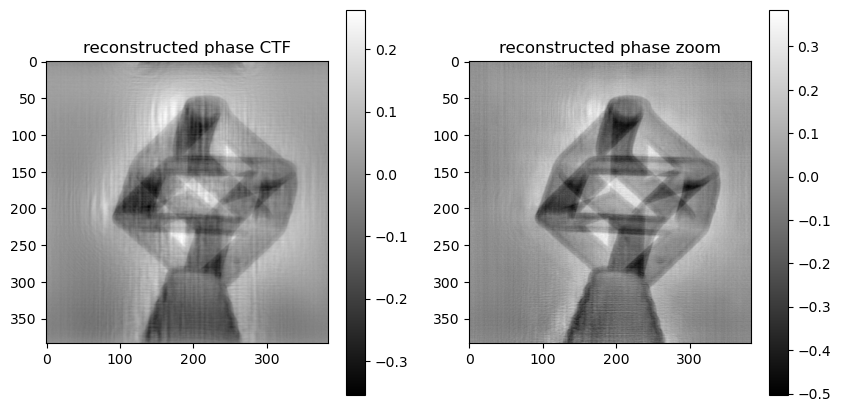

224) gammapsi=1 gammaprb=0.5, err=6.04708e+06


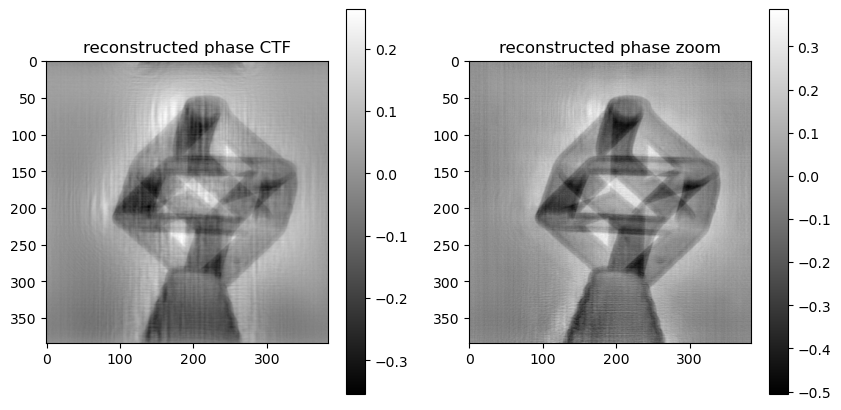

256) gammapsi=1 gammaprb=0.5, err=5.63376e+06


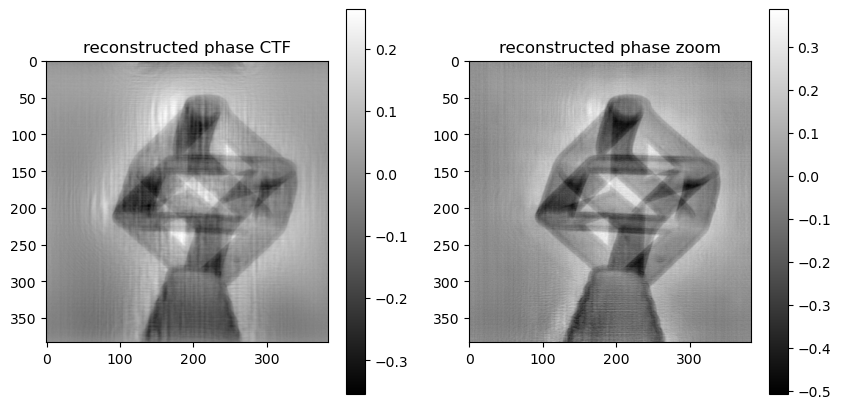

288) gammapsi=1 gammaprb=0.5, err=5.31620e+06


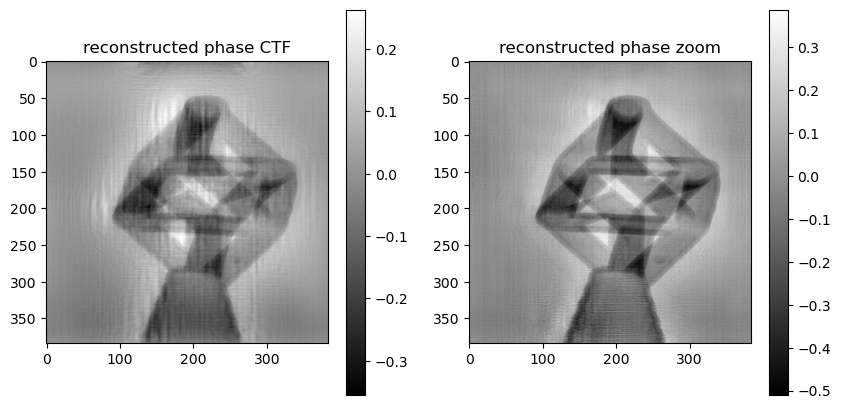

320) gammapsi=1 gammaprb=0.5, err=5.05644e+06


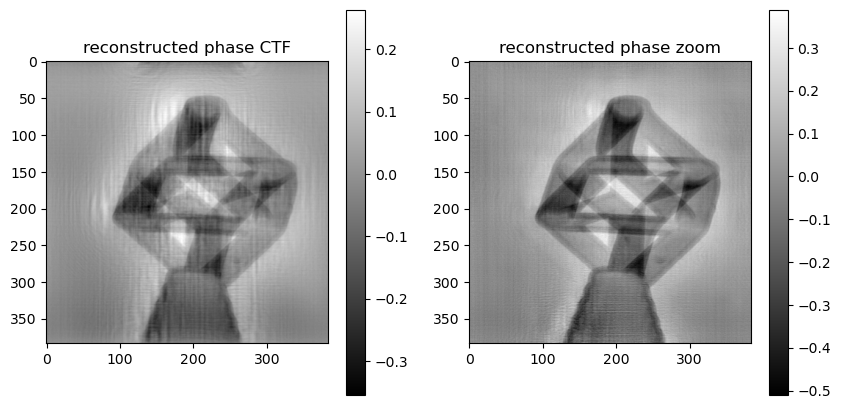

352) gammapsi=1 gammaprb=0.5, err=4.83685e+06


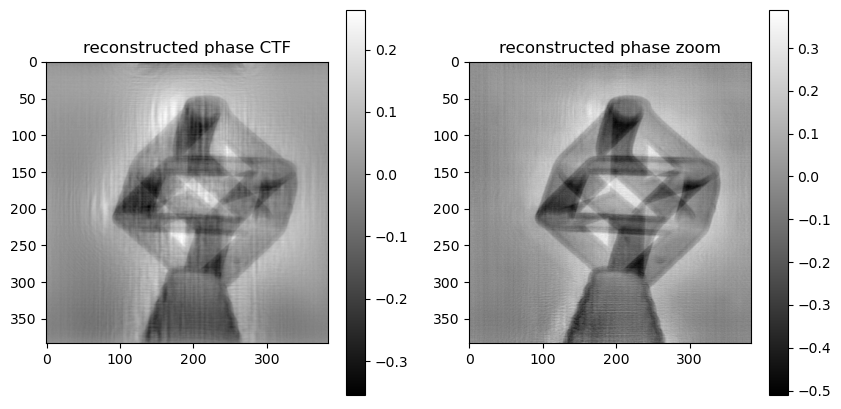

384) gammapsi=1 gammaprb=0.5, err=4.65353e+06


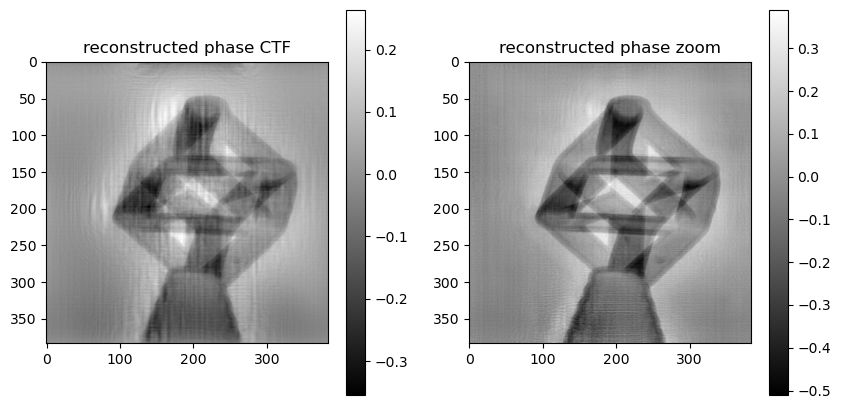

416) gammapsi=1 gammaprb=0.5, err=4.49888e+06


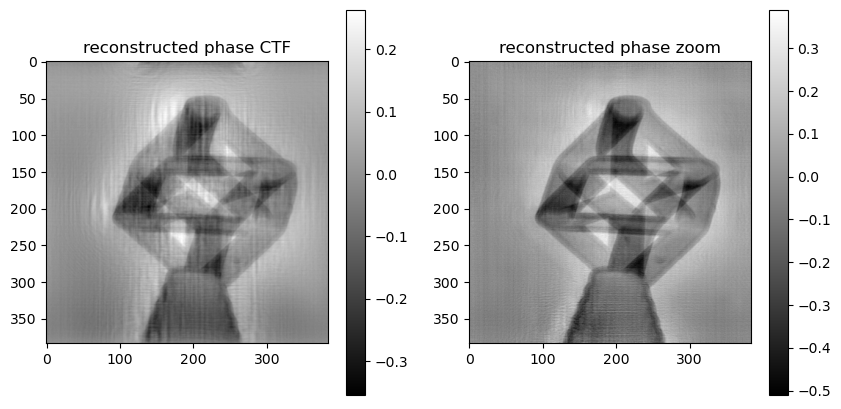

448) gammapsi=1 gammaprb=0.5, err=4.36020e+06


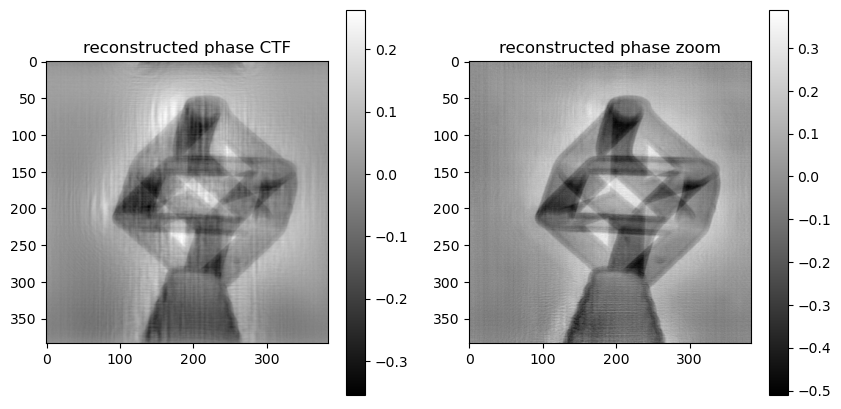

480) gammapsi=1 gammaprb=0.5, err=4.23976e+06


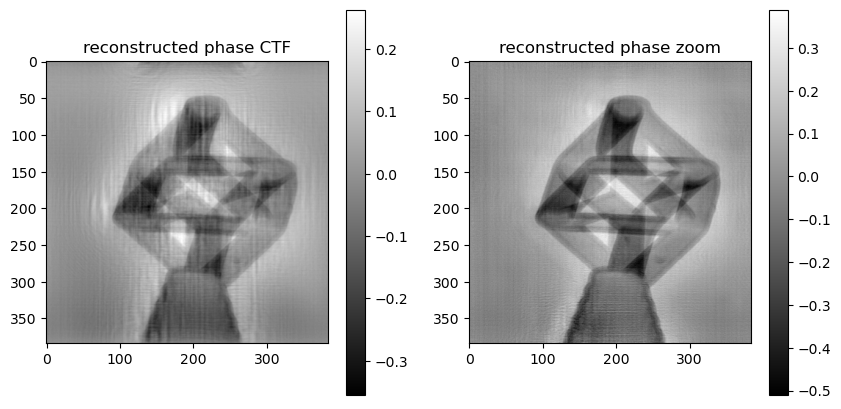

512) gammapsi=1 gammaprb=0.5, err=4.13329e+06


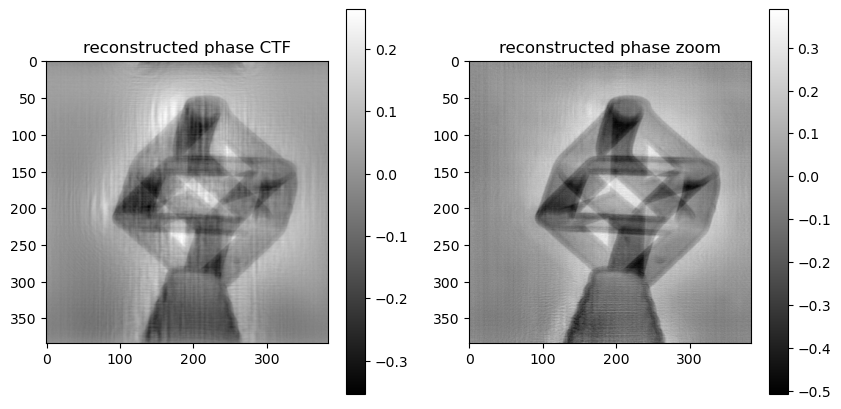

544) gammapsi=1 gammaprb=0.5, err=4.03999e+06


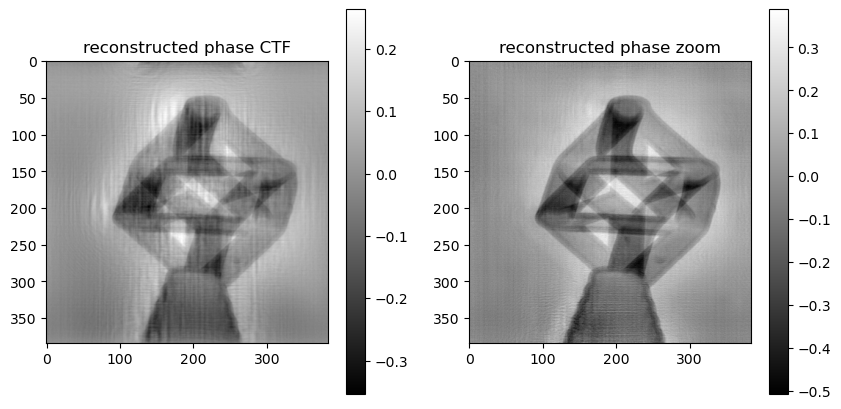

576) gammapsi=1 gammaprb=0.5, err=3.96109e+06


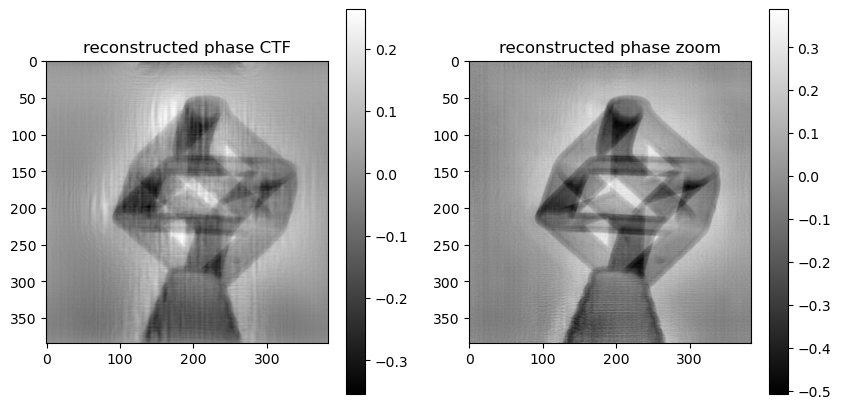

608) gammapsi=1 gammaprb=0.5, err=3.89009e+06


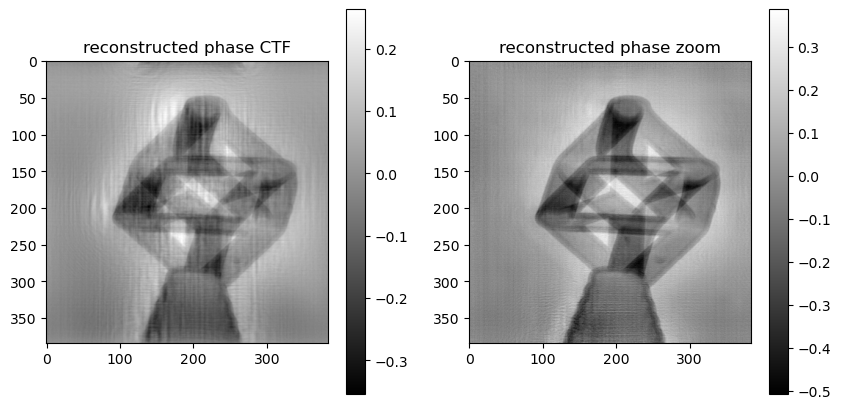

640) gammapsi=1 gammaprb=0.5, err=3.82712e+06


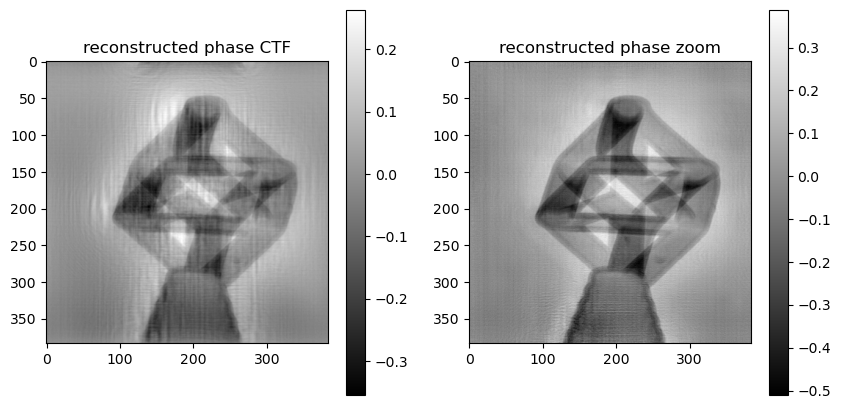

672) gammapsi=1 gammaprb=0.5, err=3.76391e+06


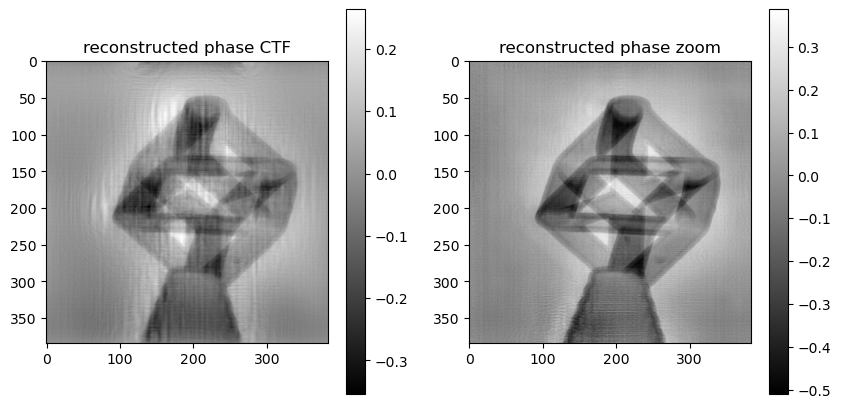

704) gammapsi=1 gammaprb=0.5, err=3.69974e+06


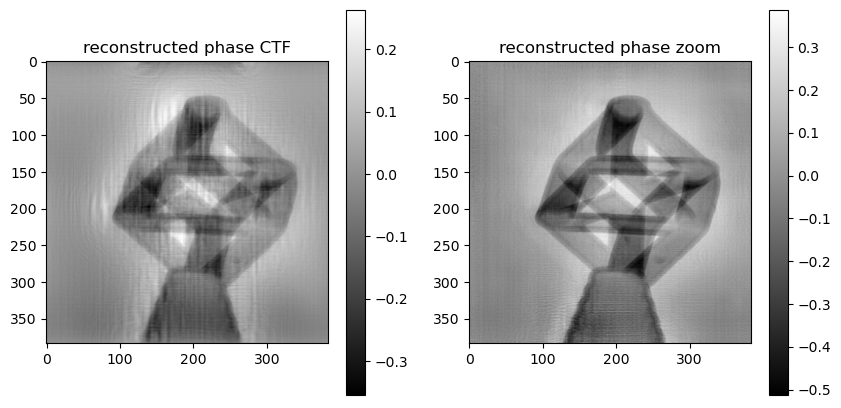

736) gammapsi=1 gammaprb=0.5, err=3.63970e+06


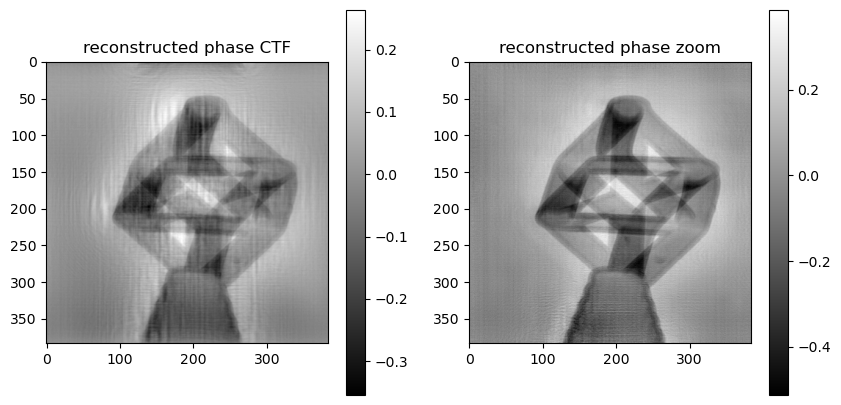

768) gammapsi=1 gammaprb=0.5, err=3.58545e+06


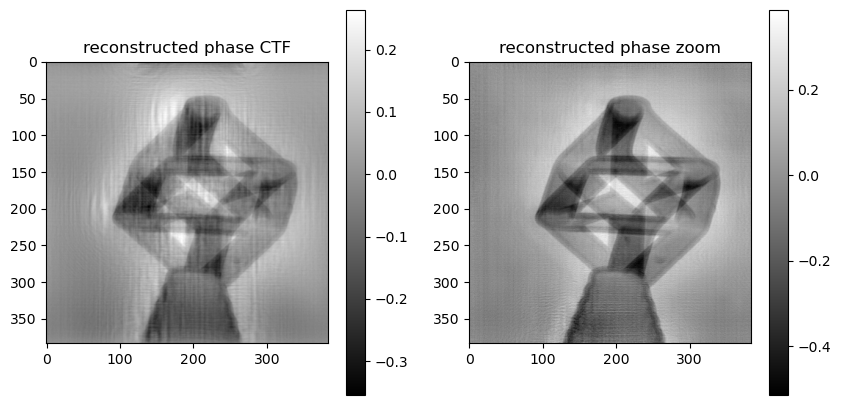

800) gammapsi=1 gammaprb=0.5, err=3.53317e+06


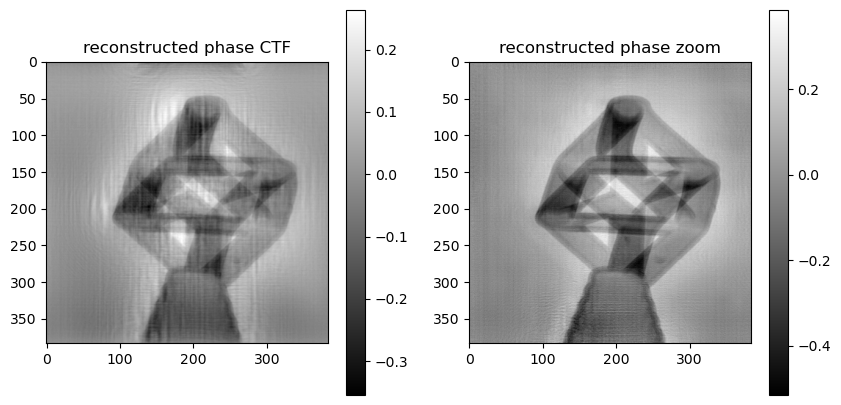

832) gammapsi=1 gammaprb=0.5, err=3.48652e+06


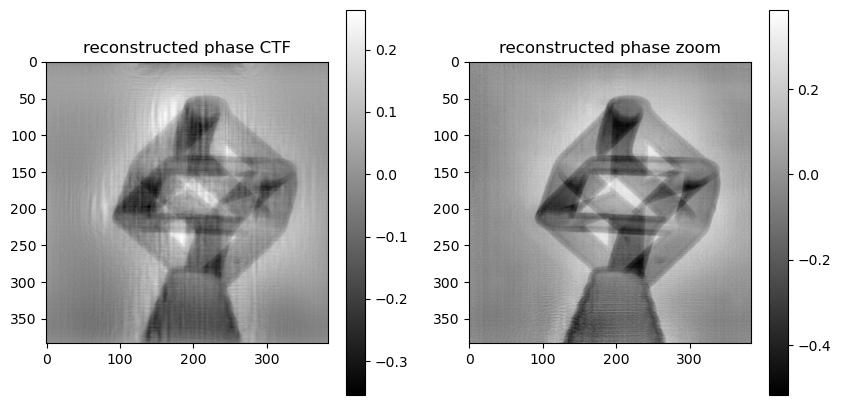

864) gammapsi=1 gammaprb=0.5, err=3.44248e+06


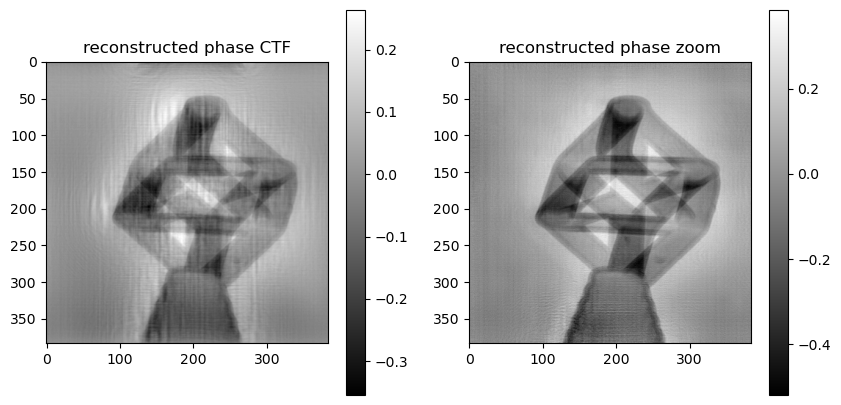

896) gammapsi=1 gammaprb=0.5, err=3.40227e+06


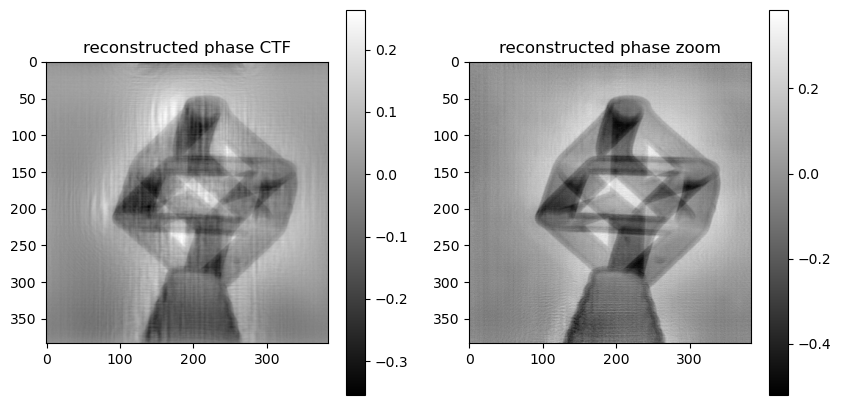

928) gammapsi=1 gammaprb=0.5, err=3.36441e+06


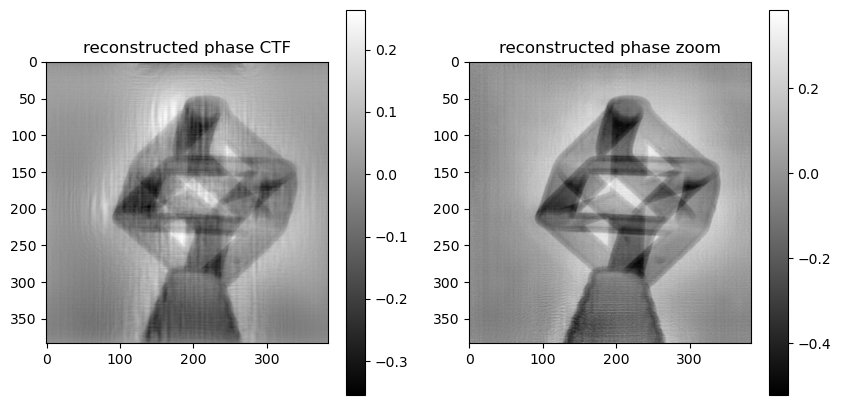

960) gammapsi=1 gammaprb=0.5, err=3.32979e+06


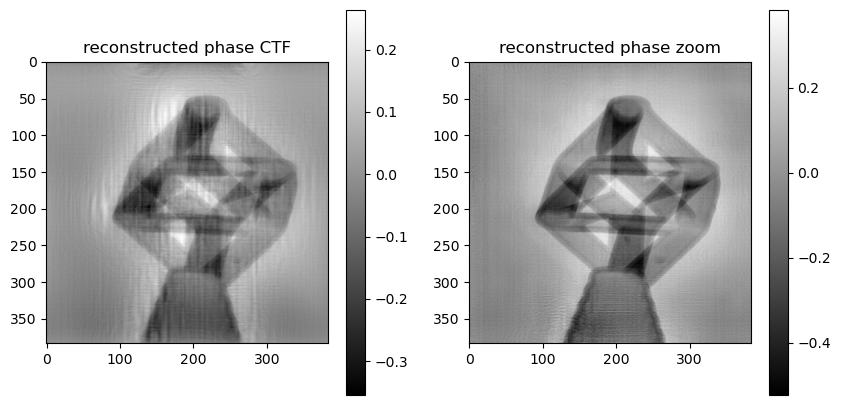

992) gammapsi=1 gammaprb=0.5, err=3.29701e+06


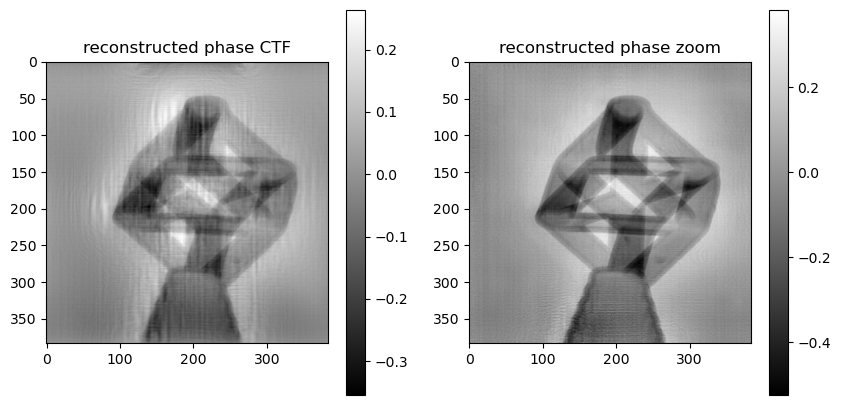

1024) gammapsi=1 gammaprb=0.5, err=3.26772e+06


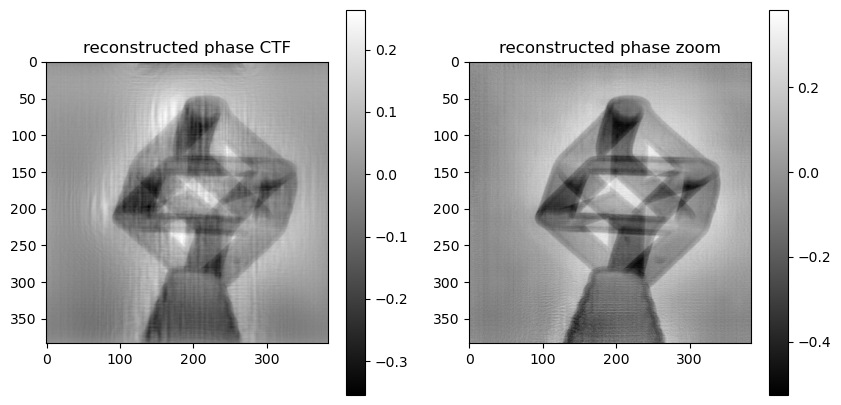

In [26]:
shifts_rec = np.array(shifts)
rec = np.ones([ntheta,2*n,2*n],dtype='complex64')
rec = np.pad(recCTFPurePhase,((0,0),(n//2,n//2),(n//2,n//2)),'edge')
# use only the abs value of the probe as initial guess
rec_prb[:] = np.abs(rec_prb0)
rec,rec_prb = cg_holo_batch(pslv, pslv0, data, data_ref, rec, rec_prb, 1025, shifts_rec, True,True,32,32)

In [22]:
from ipywidgets import interact
import ipywidgets as widgets
# if flg_show:
#     def plot_projections(sid=1):
#         plt.imshow(np.angle(rec[sid,n//2:-n//2,n//2:-n//2]),cmap='gray')
#     interact(plot_projections, sid = widgets.IntSlider(value=0,
#                                                 min=0,
#                                                 max=rec.shape[0]-1,
#                                                 step=1))

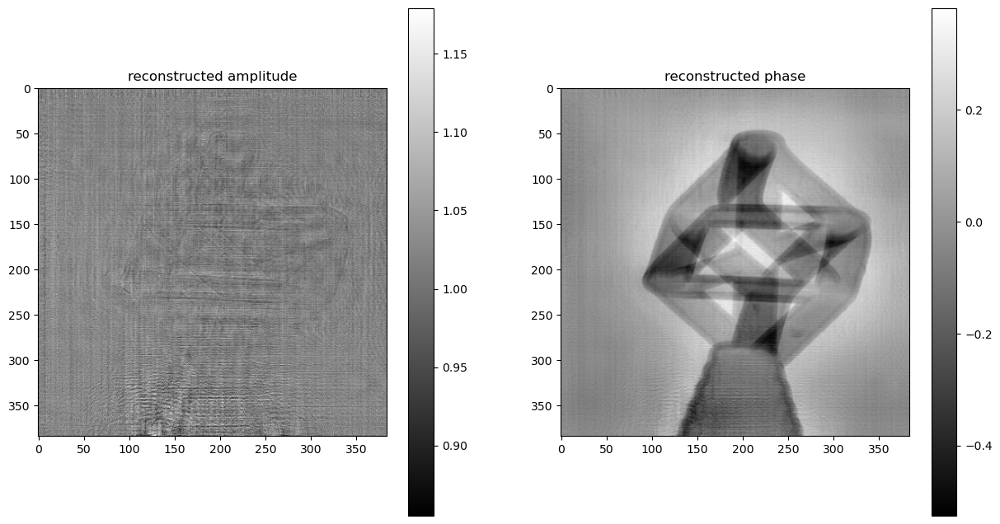

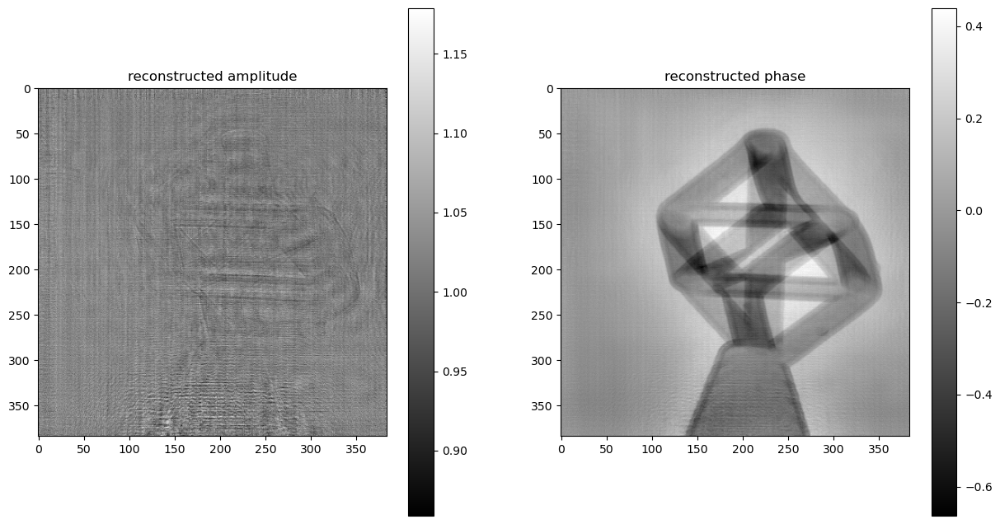

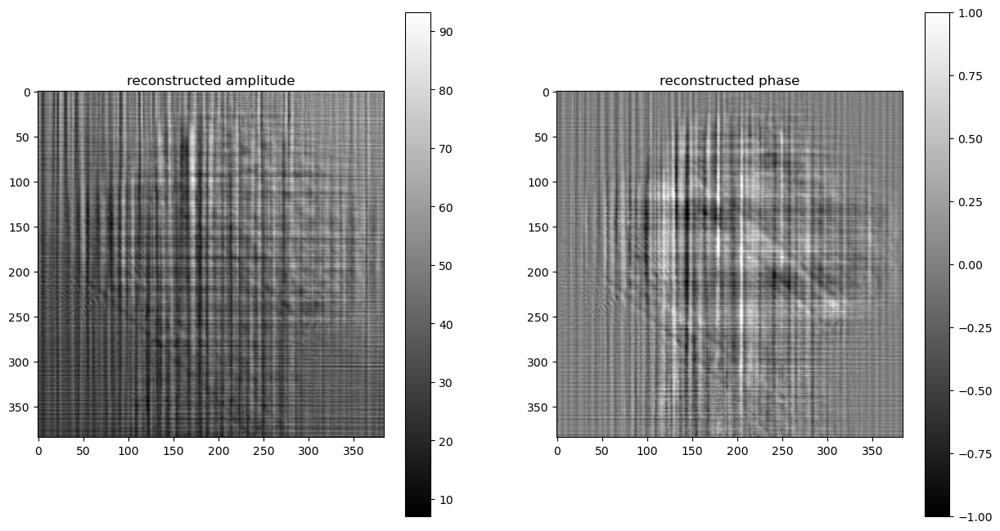

: 

In [27]:
dxchange.write_tiff(np.abs(rec),f'/data/vnikitin/holo//psirec_3d_ald_abs{n}_{ntheta}_{ndist}',overwrite=True)
dxchange.write_tiff(np.angle(rec),f'/data/vnikitin/holo/psirec_3d_ald_angle{n}_{ntheta}_{ndist}',overwrite=True)

dxchange.write_tiff(np.abs(rec_prb),f'/data/vnikitin/holo/prbrec_3d_ald_abs{n}_{ntheta}_{ndist}',overwrite=True)
dxchange.write_tiff(np.angle(rec_prb),f'/data/vnikitin/holo/prbrec_3d_ald_angle{n}_{ntheta}_{ndist}',overwrite=True)


fig, axs = plt.subplots(1, 2, figsize=(15, 8))
im=axs[0].imshow(np.abs(rec[0,n//2:-n//2,n//2:-n//2]),cmap='gray')
axs[0].set_title('reconstructed amplitude')
fig.colorbar(im)
im=axs[1].imshow(np.angle(rec[0,n//2:-n//2,n//2:-n//2]),cmap='gray')
axs[1].set_title('reconstructed phase')
fig.colorbar(im)
fig, axs = plt.subplots(1, 2, figsize=(15, 8))
im=axs[0].imshow(np.abs(rec[ntheta//8,n//2:-n//2,n//2:-n//2]),cmap='gray')
axs[0].set_title('reconstructed amplitude')
fig.colorbar(im)
im=axs[1].imshow(np.angle(rec[ntheta//8,n//2:-n//2,n//2:-n//2]),cmap='gray')
axs[1].set_title('reconstructed phase')
fig.colorbar(im)
fig, axs = plt.subplots(1, 2, figsize=(15, 8))
im=axs[0].imshow(np.abs(rec_prb[0]),cmap='gray')
axs[0].set_title('reconstructed amplitude')
fig.colorbar(im)
im=axs[1].imshow(np.angle(rec_prb[0]),cmap='gray',vmin=-1,vmax=1)
axs[1].set_title('reconstructed phase')
fig.colorbar(im)
# np.save('/data/tmp/rec',rec)


In [24]:
raise Exception("Finished code")

Exception: Finished code

# Convert the recovered transmittance function to the complex refractive index: $-\frac{i \lambda}{2\pi} \log(\psi)$  

In [ ]:
projrec = pslv.logtomo(rec)

# Show sinogram

In [ ]:
print(projrec.shape)
fig, axs = plt.subplots(1, 2, figsize=(9, 4))
im=axs[0].imshow(np.real(projrec[0]),cmap='gray')
fig.colorbar(im)
im=axs[1].imshow(np.imag(projrec[0]),cmap='gray')
fig.colorbar(im)

## Step 1. $\sum_i\sum_j||\mathcal{G}_{d_j}((\mathcal{G}_{d'_j}q)(M_j S_{r_{ij}}\psi_i))|-\sqrt{\text{I}_{ij}}\|^2_2\to \text{min}_{\psi_i,q} $
$i$ - index for angles\
$j$ - index for planes \
$\psi$ - sample at plane 0 \
$q$ - probe at plane 0\
$M_j$ - object normalized (de-)magnification for the plane $j$ \
$S_r$ - shift for distance r (x and y), shifts between angles + alignment shifts \
$\mathcal{G}_d$ - Fresnel transform for distance $d$

## Step 2.  $\sum_i\|\mathcal{R}_i u-\frac{\text{i} \lambda}{2\pi} \log(\psi_i)\|^2_2\to\text{min}_u$  
$\mathcal{R}_i$ - Radon transform wrt angle i\

$u = 1-\delta_0+\beta \to  u = \delta+\beta$


In [ ]:
pslv = []
pslv0 = []

tslv = holotomo.SolverTomo(theta/180*np.pi, ntheta, 2*n, 2*n, pn, 2*center)
init = np.zeros([2*n,2*n,2*n],dtype='complex64')
piter = 64
urec = tslv.cg_tomo_batch(projrec,init,piter)

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(9, 9))
im=axs[0,0].imshow(urec[n].real,cmap='gray')
axs[0,0].set_title('reconstructed delta, horizontal slice')
fig.colorbar(im)
im=axs[0,1].imshow(urec[n].imag,cmap='gray')
axs[0,1].set_title('reconstructed beta, horizontal slice')
fig.colorbar(im)
im=axs[1,0].imshow(urec[:,n].real,cmap='gray')
axs[1,0].set_title('reconstructed delta, vertical slice')
fig.colorbar(im)
im=axs[1,1].imshow(urec[:,n].imag,cmap='gray')
axs[1,1].set_title('reconstructed beta, vertical slice')
fig.colorbar(im)

In [ ]:

dxchange.write_tiff(urec.real,f'/data/vnikitin/holo/urec_3d_ald_re{n}_{ntheta}_{ndist}',overwrite=True)
dxchange.write_tiff(urec.imag,f'/data/vnikitin/holo/urec_3d_ald_im{n}_{ntheta}_{ndist}',overwrite=True)
